# Authors
### Mateusz Nowicki 156064
### Jędrzej Miczke 156068

### imports

In [24]:

import numpy as np
import math
from IPython.display import Image
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
import pandas as pd
import datetime
import glob
from matplotlib.colors import Normalize
from scipy.stats import gaussian_kde
from numpy.lib.stride_tricks import as_strided
from scipy.ndimage import label
from scipy.ndimage import convolve


# Description of the algorithm flow  and all methods used
##### The  algorithm is a final result of numerous trials and errors, and therefore it comprises  a wide spectrum of different techniques learned during the Computer Vision Labs. The steps undertaken in the algorithm are listed and described below.



1. First step  that we knew we need to do  after analyzing the image created from the data with plotting function  and after analyzing the density distribution of the values  in the data was denosing. We concluded that the data is inherently noisy and thus we must somehow deal with it. To tackle this issue, we managed to find 3 data files 090017.npy,090027.npy,090037.npy which contained only the noise. We took the average from the absolute value of this noise, scaled it by some empirically found constant in this case 3 and subtracted it from the data.

2. Second thing , we spotted that the columns , so different points in space, have different overall saturation, some seemed to be more saturated and some less. this is definitely an unfavourable quality of the data, so to get rid of this, we set the sum of each column to be equal to 1 carrying out the column normalization

3. After these 2 steps, in order to enhance the saturation  , and delineate the points with high values - potential lines corresponding to vehicles, we performed the gamma correction 

4. Due to the fact that the dimensions of the data are highly non-symmetrical i.e 37500 X 52  it would be difficult for any line detecting algorithm
To fit a continous line of a decent length. Probably the lines found be very shattered and fragmented as the tiniest  change in the speed would result in the change of the slope, due to very high sensitivity - the dy being 0.0016 - very frequent measurments and dx - 5.1 m , not comparably many measurment point . So to tackle this issue we performed the downsampling in the time domain. We aggregated every 100 time measurments into 1, taking as result of the aggregation the median. We also tried with the max and mean, but empirically the median proved to perform the best. We are aware that this way we inevitably loose some accuracy in the speed assesment though.

5. Next step after the time dimension downsampling was clipping the outliers, first we clipped the outliers with too big values, by just simply setting the values of all pixels above some threshold percentile to the value of threshold percentile , empirically set to 97. This helped to equalize response of different lines, because beforehand some lines had much stronger response, due to the mass of the vehicle maybe. Unfortunately this also created  some additional noise, because when the values were rescaled, the low noise values became relatively bigger

6. Now with the reponse of the lines already discernable we wanted to amplify them even further, therefore we decided to use high pass filter, mainly sobel filter . We decided to use only the vertical component of the sobel filter due to the fact, that horizontal edges were often a part of noise whereas the vertical edges were much less likely to be noise, but most often were  a part of a line to detect.

7. At this point the responses of the lines are very clearly discernable on the image , but unfortunately again due to steps 5 and 6  some noise was created . So to deal with this noise ,we used a kind of a low pass filter, i.e we clipped all the  pixels where  the value was below some threshold to 0, as we deducted that these values are more likely to correspond to noise. The empirically set threshold -97 percentile

8. After the denoising  of step 7  what was now left was supposed to be in the major part the lines that we were supposed to detect. But they were quite thin and not necessarly connected. So we carried out a dilation with 2X2 kernel

9.  At this point the responses of the lines are dilated, and pretty strong, but there are still some remnants of the noise and the picture is not yet binary which will be necessary for the further line detecting algorithms. So it is time to threshold the data. Since as I said , due to previous preprocessing, the responses of the lines are already very strong in comparison to the responses of the noise, we could threshold at 99 percentile , getting rid of the much of the remaining noise, and yet not loosing that much of the relevant information

10. To finally deal with the very last remnants of the noise, what we decided to do  was analyze the contours  on the binarized image. The contours that were very small and detached from other contours were not likely to correspond to any valid line response, therefore we decided to get rid of them.

11. At this point we are already with what we assume to be only the valid responses of sensors due to movement of the vehicles. However the lines are not smooth, and not necessarly utterly connected. so now we decide to perform an operation similar to dilation based on the neighbourhood operations, mainly we check the 5X5 neighbourhood of each pixel with 0 response, and if the number of neighbours with value of 1 is above some threshold for this pixel, we set it to one. This way we may connect the disconnected components of the lines to some extent and also we can smooth the lines to faciliate the work of the line detecting algorithms in the next step

12. The first line detecting algorithm , is basically drawing line in each contour of the remaining data, but to determine the direction of the line, we take the convex hull of each contour  and set two most distant points on this hull as the endpoints of the line


13. The final step of the algorithm involves merging the created lines which preasumably belong to the same object. The idea is not very complicated. Mainly: we extend each line, created by the procedure in the previous step, to the right and check whether it is close enough to another contour if so we connect the lines for these 2 contours. We mark the points of the extension to be able to determine the change in the lines. We prune lines which are too vertical and to short, as the first ones mistakenly connect lines belonging to the different vehicles and the second ones correspond to noise.


### flowchart

flowchart of the algorithm

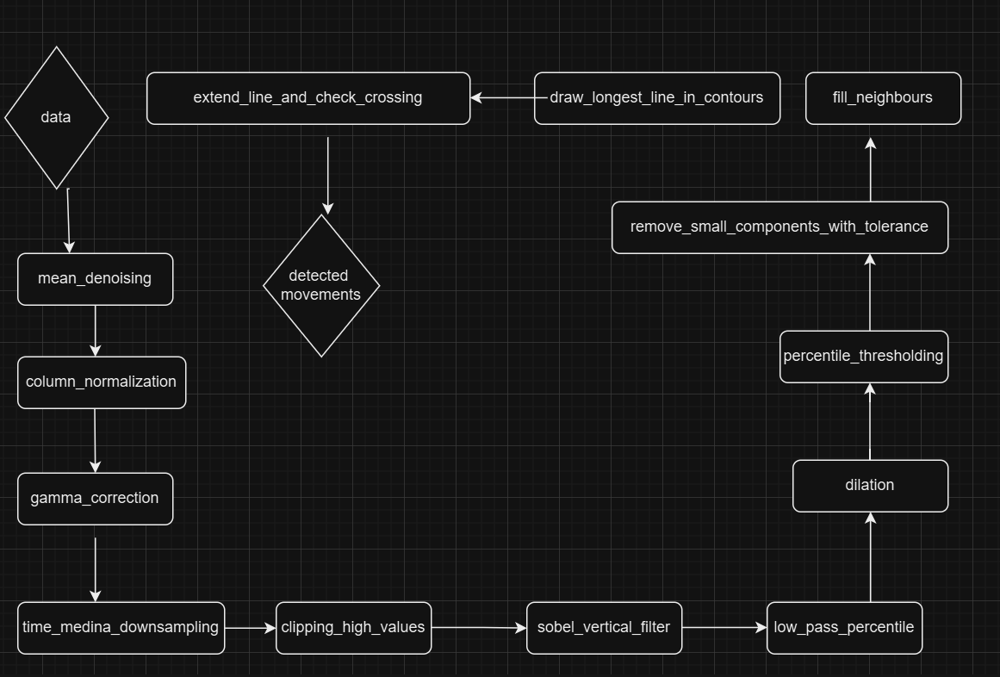

In [25]:
Image(filename='./flowchart_work2.png') 

### data analysis

##### the distribution of data, 

before any preprocessing, we can see the distirbution is very skewed, which accounts for many noise values and extreme outliers as the responses of the sensors to vehicles

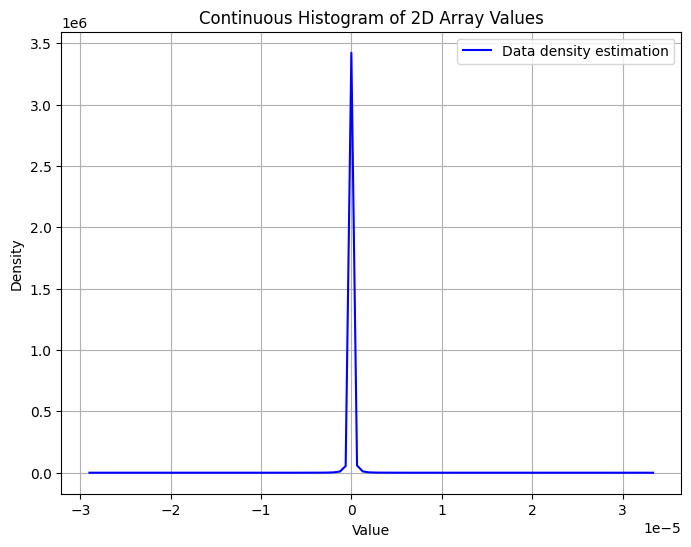

In [26]:
Image(filename='./distribution_unprocessed.png') 

##### the distribution of data, 

Therefore we decided to carry out the preprocessing and denosing, and alread after the basic preprocessing, eg clipping outliers, normalizing and 0 , setting only positive values, the distribution looks much better:

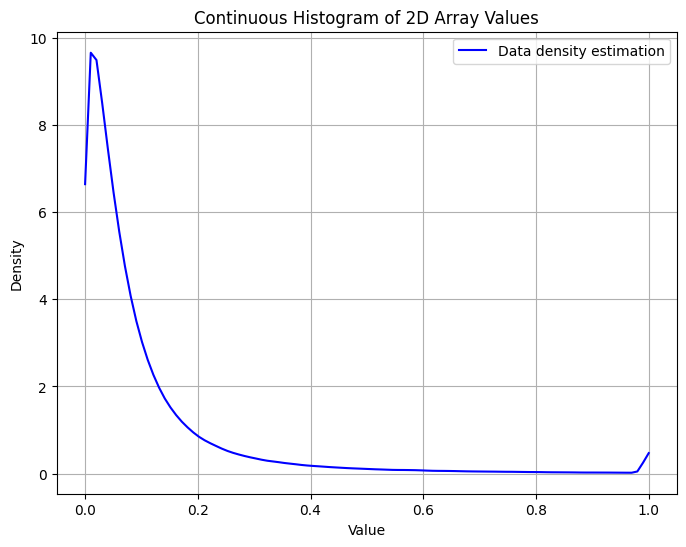

In [27]:
Image(filename='./distribution_processed.png') 

# Utils
##### here all the functions used in the notebook are stored.

### Imports

In [28]:

import numpy as np
import math
from IPython.display import Image
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
import pandas as pd
import datetime
import glob
from matplotlib.colors import Normalize
from scipy.stats import gaussian_kde
from numpy.lib.stride_tricks import as_strided
from scipy.ndimage import label
from scipy.ndimage import convolve


In [29]:
def set_axis(x, no_labels = 7)->tuple[np.array, np.array]:
    """Sets the x-axis positions and labels for a plot.

    Args:
        x (np.array): The x-axis data.
        no_labels (int, optional): The number of labels to display. Defaults to 7.

    Returns:
        tuple[np.array, np.array]: A tuple containing:
            - The positions of the labels on the x-axis.
            - The labels themselves.
    """
    nx = x.shape[0]
    step_x = int(nx / (no_labels - 1)) 
    x_positions = np.arange(0,nx,step_x) 
    x_labels = x[::step_x]
    return x_positions, x_labels











### Dataframe creation

In [30]:
def read_and_concatenate_files(path_out):
    """
    Reads files in chunks of 6, concatenates the data, and creates DataFrames for each chunk.
    
    Parameters:
        files (list of str): List of file paths to load the data from.
        dx (float): Spacing between columns (default is 5.1065).
        dt (float): Time step for the frequency (default is 0.0016 seconds).
        
    Returns:
        List of pandas DataFrames: List of DataFrames for each chunk of 6 files.
    """
    dx=5.106500953873407
    dt=0.0016
    dataframes = []
    files = glob.glob(path_out+"*")
    files.sort()
    
    # Loop over the files in chunks of 6
    for i in range(0, len(files), 6):
        data_chunk = []
        
        # Process the current chunk of 6 files
        for file in files[i:i+6]:
            data_chunk.append(np.load(file))
        
        # Concatenate the data
        data_chunk = np.concatenate(data_chunk)
        
        # Retrieve start time for each chunk (using the first file in the chunk)
        time_start = datetime.datetime.strptime('2024-05-07 ' + files[i].split("\\")[-1].split(".")[0], "%Y-%m-%d %H%M%S")
        
        # Create pandas date range (assumes each chunk has the same length)
        index = pd.date_range(start=time_start, periods=len(data_chunk), freq=f'{dt}s')
        
        # Create columns based on dx
        columns = np.arange(len(data_chunk[0])) * dx
        
        # Create DataFrame
        df = pd.DataFrame(data=data_chunk, index=index, columns=columns)
        
        # Store the DataFrame in the list
        dataframes.append(df)
    
    return dataframes


### Basic preprocessing

In [31]:
def basic_preprocessing(df, minmax=False,ret_dataframe=False):
    
    # Make a copy of the input DataFrame to avoid modifying it
    new_df = df.copy()
    
    # Center the data by subtracting the mean
    new_df -= new_df.mean()
    
    # Take the absolute value
    new_df = np.abs(new_df)
    
    # Clip outliers at the 3rd and 99th percentiles
    low, high = np.percentile(new_df.values, [3, 99])  # Use .values to apply percentiles to the entire data
    
    new_df = np.clip(new_df, low, high)
    
    # Apply min-max scaling if specified
    if minmax:
        new_df = (new_df - low) / (high - low)
        new_df[new_df < 0] = 0  # Ensure lower values are clipped correctly

    # Return as DataFrame to preserve structure
    if ret_dataframe:
        return pd.DataFrame(new_df, index=df.index, columns=df.columns)
    else:
        numpy_array = new_df.to_numpy()
        return numpy_array

### Denoising and preprocessing functions 

In [32]:





'''this filter is used in order to get rid of the noise in each column, basicaly we check the distribution of each column value, and clip the value above some percentile, which is
empirically tweaked by us '''

def low_pass_filter_percentile(image, percentile=60, ret_dataframe=True):
    
    # Convert DataFrame to numpy array if needed
    data = image.to_numpy()
    
    # Create an array of column-wise percentiles
    column_percentiles = np.percentile(data, percentile, axis=0)
    
    # Apply the filter: set values below the percentile to 0
    filtered_data = np.where(data >= column_percentiles, data, 0)

    
    # Return in the appropriate format
    if ret_dataframe and isinstance(image, pd.DataFrame):
        return pd.DataFrame(filtered_data, index=image.index, columns=image.columns)
    else:
        return filtered_data
    

'''clipping values above some percentile threshold to 0, but the percentile for whole data not for each column separately'''
def low_pass_filter_all(image,percentile_thresh =90,ret_dataframe = True):
    data = image.to_numpy()

    percentile = np.percentile(data,percentile_thresh)

    filtered_data = np.where(data<=percentile,0,data)

    if ret_dataframe and isinstance(image, pd.DataFrame):
        return pd.DataFrame(filtered_data, index=image.index, columns=image.columns)
    else:
        return filtered_data






'''just subtracting the mean of the noise observed on the data with only noise scaled by some constant '''

def mean_denoising(noise,image,constant, ret_dataframe = True,threshold=None):
    img = image.to_numpy()
    if not threshold:
        threshold = np.median(img)
    mean_of_noise = np.mean(abs(noise))
    img = np.where(img>threshold, img, np.maximum(img-(constant*mean_of_noise),0))
    if ret_dataframe:
        return pd.DataFrame(img, index=image.index, columns=image.columns)
    else:
        return img

  

    
'''subtracting the mean of the noise but for each column separatley '''
def column_denoising(noise,image,constant,ret_dataframe = True, threshold=None):
    img = image.to_numpy()
    img = abs(img)
    if not threshold:
        threshold = np.median(img)
    mean_of_noise_columns = np.mean(abs(noise),axis=0)
    subtracted =  img - (constant*mean_of_noise_columns)
    subtracted = np.maximum(0,subtracted)
    to_return= np.where(img>threshold,img,subtracted)
    if ret_dataframe:
        return pd.DataFrame(to_return, index=image.index, columns=image.columns)
    else:
        to_return

# def normalizing_columns(image):
#     pass


    
'''column normalization, setting sum in each column to 1.
performed due to the fact that some of the columns as whole seemed to be more saturated, what was not correlted with response to any vehicle  '''
def normalizing_columns(image, target_sum=1, ret_dataframe=True):
    
    if isinstance(image, pd.DataFrame):
        img = image.to_numpy()
    else:
        img = np.array(image)
    img = abs(img)

    # Calculate the sum of each column
    col_sums = np.sum(img, axis=0)
    
    # Avoid division by zero
    col_sums[col_sums == 0] = 1
    
    # Normalize each column to have the desired sum
    normalized = img / col_sums * target_sum

    if ret_dataframe and isinstance(image, pd.DataFrame):
        return pd.DataFrame(normalized, index=image.index, columns=image.columns)
    else:
        return normalized
''''''


'''used to enhance  saturation in the data'''
def gamma_correction(image, gamma=1.2,ret_dataframe=True):
    # Ensure the image is in the range [0, 1]
    img = image.to_numpy()
    img = np.clip(img, 0, 1)
    
    # Apply gamma correction
    corrected_img = np.power(img, gamma)
    if ret_dataframe:
        return pd.DataFrame(corrected_img, index=image.index, columns=image.columns)
            
    return corrected_img


def clip_above_percentile(image, percentile_thresh=80, ret_dataframe=True):
    
    # Convert image to numpy array if it is a DataFrame
    if isinstance(image, pd.DataFrame):
        img = image.to_numpy()
    else:
        img = image
    
    # Find the specified percentile value
    percentile_value = np.percentile(img, percentile_thresh)
    
    # Clip the values above the specified percentile
    clipped_img = np.where(img > percentile_value, percentile_value, img)
    
    # Return the result in the appropriate format
    if ret_dataframe and isinstance(image, pd.DataFrame):
        return pd.DataFrame(clipped_img, index=image.index, columns=image.columns)
    else:
        return clipped_img


### Time downsampling

In [33]:
'''aggregating pixels on time axis , takin max as result'''
def downsampling_time_max(df,window_size=50,ret_dataframe=True):
    data = df.to_numpy()

    # Ensure the number of rows is divisible by the window size
    trimmed_size = (data.shape[0] // window_size) * window_size
    trimmed_data = data[:trimmed_size]  # Trim excess rows if necessary

    # Reshape and compute median
    downsampled_data = np.max(trimmed_data.reshape(-1, window_size, data.shape[1]), axis=1)

    if ret_dataframe:
        # Create a new index
        new_index = df.index[:trimmed_size:window_size]  # Take every `window_size` step
        return pd.DataFrame(downsampled_data, index=new_index, columns=df.columns)
    else:
        return downsampled_data
    
'''aggregating pixels on time axis , takin max -mean as result'''
def downsampling_time_max_mean(df,window_size=50,ret_dataframe=True):
    data = df.to_numpy()

    # Ensure the number of rows is divisible by the window size
    trimmed_size = (data.shape[0] // window_size) * window_size
    trimmed_data = data[:trimmed_size]  # Trim excess rows if necessary

    # Reshape and compute median
    downsampled_data_max = np.max(trimmed_data.reshape(-1, window_size, data.shape[1]), axis=1)
    downsampled_data_mean = trimmed_data.reshape(-1, window_size, data.shape[1]).mean(axis=1)
    downsampled_data = downsampled_data_max - downsampled_data_mean

    if ret_dataframe:
        # Create a new index
        new_index = df.index[:trimmed_size:window_size]  # Take every `window_size` step
        return pd.DataFrame(downsampled_data, index=new_index, columns=df.columns)
    else:
        return downsampled_data
    
'''aggregating pixels on time axis , takin mean as result'''
def downsampling_time_mean(df, window_size=10, ret_dataframe=True):
    data = df.to_numpy()

    # Ensure the number of rows is divisible by the window size
    trimmed_size = (data.shape[0] // window_size) * window_size
    trimmed_data = data[:trimmed_size]  # Trim excess rows if necessary

    # Reshape and compute mean
    downsampled_data = trimmed_data.reshape(-1, window_size, data.shape[1]).mean(axis=1)


    if ret_dataframe:
        # Create a new index
        new_index = df.index[:trimmed_size:window_size]  # Take every `window_size` step
        return pd.DataFrame(downsampled_data, index=new_index, columns=df.columns)
    else:
        return downsampled_data

'''aggregating pixels on time axis , takin median as result'''
def downsampling_time_median(df, window_size=10, ret_dataframe=True):
    data = df.to_numpy()

    # Ensure the number of rows is divisible by the window size
    trimmed_size = (data.shape[0] // window_size) * window_size
    trimmed_data = data[:trimmed_size]  # Trim excess rows if necessary

    # Reshape and compute median
    downsampled_data = np.median(trimmed_data.reshape(-1, window_size, data.shape[1]), axis=1)

    if ret_dataframe:
        # Create a new index
        new_index = df.index[:trimmed_size:window_size]  # Take every `window_size` step
        return pd.DataFrame(downsampled_data, index=new_index, columns=df.columns)
    else:
        return downsampled_data
    

### morphologic operations

In [34]:
'''for creating structuring element basing on the type of input'''
def get_structuring_element(kernel):
    
    if isinstance(kernel, int):
        return cv2.getStructuringElement(cv2.MORPH_CROSS, (kernel, kernel))
    elif isinstance(kernel, tuple):
        return cv2.getStructuringElement(cv2.MORPH_CROSS, (kernel[1], kernel[0]))
    elif isinstance(kernel, np.ndarray):  # Assume it's already a structuring element
        return kernel
    else:
        raise ValueError("Kernel must be an int, tuple, or a valid structuring element (numpy array).")





def morphological_opening(image, kernel):
    """Standard morphological opening (erosion followed by dilation)."""
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)

def morphological_closing(image, kernel):
    """Standard morphological closing (dilation followed by )."""
    return cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)


'''proper opening'''
def proper_opening(image, kernel,ret_dataframe=True):
    """
    Proper opening: Q(f) = min(f, C(O(C(f))))
    as was on classes

    """
    
    img = image.to_numpy()

    kernel = get_structuring_element(kernel)
    
    
    # Standard closing followed by opening
    closing = morphological_closing(img, kernel)
    opening = morphological_opening(closing, kernel)
    second_closing = morphological_closing(opening, kernel)

    # Proper opening: min(original, second_closing)
    proper_opened = np.minimum(img, second_closing)
    if ret_dataframe:
        return pd.DataFrame(proper_opened, index=image.index, columns=image.columns)
    else:
        return proper_opened

'''proper closing '''
def proper_closing(image, kernel,ret_dataframe=True):
    """
    Proper closing: G(f) = max(f, O(C(O(f))))
    as was on classes
    """
    img = image.to_numpy()
    # if len(kernel) ==1:
    #     kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel[0], kernel[0]))
    # elif len(kernel) ==2:
    #     kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel[1], kernel[0]))

    kernel = get_structuring_element(kernel)
    
    # Standard opening followed by closing
    opening = morphological_opening(img, kernel)
    closing = morphological_closing(opening, kernel)
    second_opening = morphological_opening(closing, kernel)

    # Proper closing: max(original, second_opening)
    
    proper_closed = np.maximum(img, second_opening)
    
    if ret_dataframe:
        return pd.DataFrame(proper_closed, index=image.index, columns=image.columns)
    else:
        return proper_closed
    
'''dilation'''
def dilate(image, kernel, kernel_shape=cv2.MORPH_CROSS,ret_dataframe=True):
    """
    Perform morphological dilation on binary image
    """
    data = image.to_numpy()

    min_val = np.min(data)
    max_val = np.max(data)
    
    # Scale to the range [0, 255]
    normalized_image = (data - min_val) / (max_val - min_val) * 255
    normalized_image = np.clip(normalized_image, 0, 255).astype(np.uint8)

    # if len(kernel) ==1:
    #     kernel = cv2.getStructuringElement(kernel_shape, (kernel[0], kernel[0]))
    # elif len(kernel) ==2:
    #     kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel[0], kernel[1]))

    kernel = get_structuring_element(kernel)

    dilated_image = cv2.dilate(data, kernel)
    if ret_dataframe:
        return pd.DataFrame(dilated_image, index=image.index, columns=image.columns)
    else:
        return dilated_image


'''erosion'''
def erode(image, kernel=3, kernel_shape=cv2.MORPH_RECT,ret_dataframe=True):
    """
    Perform morphological erosion on binary image 

    """
    img = image.to_numpy()
    # if len(kernel)==1:
    #     kernel = cv2.getStructuringElement(kernel_shape, (kernel[0], kernel[0]))
    # elif len(kernel) ==2:
    #     kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel[0], kernel[1]))

    kernel = get_structuring_element(kernel)

    eroded_image = cv2.erode(img, kernel)
    
    if ret_dataframe:
        return pd.DataFrame(eroded_image, index=image.index, columns=image.columns)
    else:
        return eroded_image

'''continous dilation - max'''
def continous_dilation(image, structuring_element,ret_dataframe):
    """
    Perform continuous domain dilation on normal image like [0-255] range.
    """
    img = image.to_numpy()
    
    if len(structuring_element.flatten()) >2:
        kernel_h, kernel_w = structuring_element.shape  # Get kernel dimensions
    else:
        kernel_h, kernel_w = structuring_element[0], structuring_element[1]

   
    # Padding the image to handle boundaries
    pad_h, pad_w = kernel_h // 2, kernel_w // 2
    padded_image = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    
    # Define the shape and strides for the sliding window
    shape_strided = (
        img.shape[0], img.shape[1], kernel_h, kernel_w
    )
    strides = padded_image.strides + padded_image.strides
    
    # Create sliding window view
    image_strides = as_strided(padded_image, shape_strided, strides)
    
    # Perform dilation (max operation over the window)
    image_return = np.max(image_strides, axis=(2, 3))

    if ret_dataframe:
        return pd.DataFrame(image_return, index=image.index, columns=image.columns)
    else:
        return image_return
    
    
    
'''continous erosion - min'''
def continous_erosion(image, structuring_element,ret_dataframe=True):
    """
    Perform continuous domain erosion same as continous dilation but minimum of sliding window instead of maximum taken.

    """
    img = image.to_numpy()
    if len(structuring_element.flatten()) >2:
        kernel_h, kernel_w = structuring_element.shape  # Get kernel dimensions
    else:
        kernel_h, kernel_w = structuring_element[0], structuring_element[1]
    
    # Padding the image to handle boundaries
    pad_h, pad_w = kernel_h // 2, kernel_w // 2
    padded_image = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    
    # Define the shape and strides for the sliding window
    shape_strided = (
        img.shape[0], img.shape[1], kernel_h, kernel_w
    )
    strides = padded_image.strides + padded_image.strides
    
    # Create sliding window view
    image_strides = as_strided(padded_image, shape_strided, strides)
    
    # Perform dilation (max operation over the window)
    image_return = np.min(image_strides, axis=(2, 3))
    
    if ret_dataframe:
        return pd.DataFrame(image_return, index=image.index, columns=image.columns)
    else:
        return image_return

'''automedina'''
def automedian(image, kernel,ret_dataframe=True):
    """
    Automedian filter: A(f) = max(O(C(O(f))), Q(f))
    as was on the clasees
    """
    img = image.to_numpy()
    
    
    # Step 1: O(C(O(f)))
    kernel = get_structuring_element(kernel)
    opening = morphological_opening(img, kernel)
    closing_after_opening = morphological_closing(opening, kernel)
    second_opening = morphological_opening(closing_after_opening, kernel)
    
    # Step 2: Q(f)
    proper_opened = proper_opening(image, kernel=kernel)
    
    # Step 3: A(f) = max(O(C(O(f))), Q(f))
    automedian_filtered = np.maximum(second_opening, proper_opened)
    
    if ret_dataframe:
        return pd.DataFrame(automedian_filtered, index=image.index, columns=image.columns)
    else:
        return automedian_filtered
    
'''function to create a diagonal kernel, which couldallegedly faciliate detecting slanted lines'''
def create_diag_kernel(size,bottom_top=True):
    '''creating diagonale kernel maybe useuful for diagonla line detection? '''
    kernel = np.zeros(size, dtype=np.uint8)  # Initialize kernel with zeros

    rows, cols = size
    mid_row, mid_col = rows // 2, cols // 2

    if bottom_top:
        # Fill bottom-left and top-right
        kernel[:mid_row, mid_col:] = 1  # Top-right
        kernel[mid_row:, :mid_col] = 1  # Bottom-left
    else:
        # Fill top-left and bottom-right
        kernel[:mid_row, :mid_col] = 1  # Top-left
        kernel[mid_row:, mid_col:] = 1  # Bottom-right
    return kernel






### thresholding function

In [35]:



'''thresholding above some percentile of the data'''    
def thresholding_percentile(df,thresh,  ret_dataframe = True):
    data = df.to_numpy()
    data = (data - np.min(data)) / (np.max(data) - np.min(data)) * 255
    percentile = np.percentile(data,thresh)
    binary_image = np.where(data>=percentile,1,0)

    if ret_dataframe and isinstance(df, pd.DataFrame):
        return pd.DataFrame(binary_image, index=df.index, columns=df.columns)
    else:
        return binary_image






### edge detection

In [36]:


    
'''sobel vertical filter'''
 

def sobel_filter_vertical(image, vertical_weight=1.5, ret_dataframe=True):
    
    # Convert DataFrame to numpy array if needed
    if isinstance(image, pd.DataFrame):
        data = image.to_numpy()
    else:
        data = image

    min_val = np.min(data)
    max_val = np.max(data)
    
    # Scale to the range [0, 255]
    normalized_image = (data - min_val) / (max_val - min_val) * 255
    normalized_image = np.clip(normalized_image, 0, 255).astype(np.uint8)

    # Apply Sobel filter in the horizontal direction (vertical edges)
    grad_x = cv2.Sobel(normalized_image, cv2.CV_64F, 1, 0, ksize=3)  # Vertical edges (horizontal gradients)
    
    # Apply a small weight to vertical edges if needed (controlled by vertical_weight)
    weighted_grad_x = grad_x * vertical_weight
    
    # Normalize the result to the range [0, 255] for visualization
    weighted_grad_x = np.clip(weighted_grad_x, 0, 255).astype(np.uint8)

    # Return in the appropriate format
    if ret_dataframe and isinstance(image, pd.DataFrame):
        return pd.DataFrame(weighted_grad_x, index=image.index, columns=image.columns)
    else:
        return weighted_grad_x
    










### contour operations

In [37]:

'''removing disconnected contours with small area from the binary picture'''
def remove_small_components_with_tolerance(image, base_threshold, tolerance=2, method="median", ret_dataframe=True):
    
    # Convert DataFrame to numpy array if necessary
    img = image.to_numpy() if isinstance(image, pd.DataFrame) else image

    # Label connected components in the image
    labeled_img, num_features = label(img)

    # Calculate the size of each connected component
    component_sizes = np.bincount(labeled_img.ravel())

    # Exclude background (component 0) from size calculations
    component_sizes = component_sizes[1:]  # Skip the background

    # Calculate the median of the component sizes
    central_stat = np.median(component_sizes)

    # Calculate dynamic threshold
    dynamic_threshold = central_stat  + (tolerance * central_stat)

    # Create a mask for components larger than the dynamic threshold
    size_mask = np.zeros_like(component_sizes, dtype=bool)
    size_mask[component_sizes >= dynamic_threshold] = True

    # Add back the background (set to False)
    size_mask = np.insert(size_mask, 0, 0)

    # Remove small components
    cleaned_img = size_mask[labeled_img]

    # Convert the result to integer type (binary image: 0 or 1)
    cleaned_img = cleaned_img.astype(np.uint8)

    # Return as DataFrame if input was a DataFrame
    if ret_dataframe and isinstance(image, pd.DataFrame):
        return pd.DataFrame(cleaned_img, index=image.index, columns=image.columns)
    else:
        return cleaned_img



### neighbourhood operations

In [38]:


'''connecting the components base on the neighbourhood'''
def connect_components(image, neighbours_num):
    

    # Convert DataFrame to numpy array if needed
    img = image.to_numpy(dtype=int) if isinstance(image, pd.DataFrame) else image

    # Define the kernel for a 3x3 neighborhood (including the central pixel)
    kernel = np.ones((3, 3), dtype=int)

    # Convolve the image with the kernel to count neighbors
    neighbor_counts = convolve(img, kernel, mode='constant', cval=0)

    # Only change the pixels where the center is 0 and the number of neighbors >= neighbours_num
    
    result_img = np.where((img == 0) & (neighbor_counts >= neighbours_num), 1, img).astype(int)

    # Return as DataFrame if input was a DataFrame
    if isinstance(image, pd.DataFrame):
        return pd.DataFrame(result_img, index=image.index, columns=image.columns)
    else:
        return result_img

def fill_neighbour(image, iters=1, min_neighbours=20,ret_dataframe=True):
    img = image.to_numpy()
    
    mask = np.ones((5,5))
    mask[2][2] = 0
    
    
    # img_padded = np.pad(img, 1)
    # print(img_padded.shape, mask.shape)
    for _ in range(iters):
        count = cv2.filter2D(src=img, ddepth=-1, kernel=np.flip(mask, -1))
        
        img = np.where(count >= min_neighbours, 1, img)
    # print(np.sum(count > 3))
    # count = np.convolve(img_padded, mask)
    if isinstance(image, pd.DataFrame):
        return pd.DataFrame(img, index=image.index, columns=image.columns)
    else:
        return img
    
'''deleting the outliers basing on the neighbourhood'''
def delete_outliers(image,neighbours_num):

    img = image.to_numpy() if isinstance(image, pd.DataFrame) else image

    # Pad the image with 1-pixel border to handle edges
    padded_image = np.pad(img, ((1, 1), (1, 1)), mode='constant', constant_values=0)

    # Create sliding window view with as_strided
    shape_strided = (img.shape[0], img.shape[1], 3, 3)
    strides = padded_image.strides + padded_image.strides
    windows = as_strided(padded_image, shape_strided, strides)

    # Count non-zero neighbors in each 3x3 window
    neighbor_counts = np.sum(windows, axis=(2, 3)) - img  # Subtract center pixel itself

    # Update pixels in the result image
    result_img = np.where((img == 1) & (neighbor_counts <= neighbours_num), 0, img)

    # Return as DataFrame if input was a DataFrame
    if isinstance(image, pd.DataFrame):
        return pd.DataFrame(result_img, index=image.index, columns=image.columns)
    else:
        return result_img
    


### Plotting functions

In [39]:
def set_axis(x, no_labels = 7)->tuple[np.array, np.array]:
    """Sets the x-axis positions and labels for a plot.

    Args:
        x (np.array): The x-axis data.
        no_labels (int, optional): The number of labels to display. Defaults to 7.

    Returns:
        tuple[np.array, np.array]: A tuple containing:
            - The positions of the labels on the x-axis.
            - The labels themselves.
    """
    nx = x.shape[0]
    step_x = int(nx / (no_labels - 1)) 
    x_positions = np.arange(0,nx,step_x) 
    x_labels = x[::step_x]
    return x_positions, x_labels


'''the provided plotting function , but adjusted to show to plots in one row to be able to compare the image after and before applying some operation'''
def plotting_function(df, to_preprocess=False):
    """
    Plots a single DataFrame or two DataFrames side by side.

    Parameters:
    - df: DataFrame or list of two DataFrames to plot.
    - to_preprocess: Whether to preprocess the data.
    """
    if isinstance(df, list) and len(df) == 2:
        # Case: Two DataFrames in a list
        fig, axes = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)

        for i, single_df in enumerate(df):
            new_df = single_df.copy()
            if to_preprocess:
                new_df = basic_preprocessing(single_df, minmax=False, ret_dataframe=True)

            low, high = np.percentile(new_df, [3, 99])
            norm = Normalize(vmin=low, vmax=high, clip=True)

            im = axes[i].imshow(new_df, interpolation='none', aspect='auto', norm=norm)
            axes[i].set_ylabel('time')
            axes[i].set_xlabel('space [m]')

            # Customize axis labels
            x_positions, x_labels = set_axis(single_df.columns)
            axes[i].set_xticks(x_positions, np.round(x_labels))
            y_positions, y_labels = set_axis(new_df.index.time)
            axes[i].set_yticks(y_positions, y_labels)

            # Add colorbar
            #cax = fig.add_axes([axes[i].get_position().x1 + 0.01, axes[i].get_position().y0, 0.02, axes[i].get_position().height])
            #plt.colorbar(im, cax=cax)

        plt.show()

    elif isinstance(df, pd.DataFrame):
        # Case: Single DataFrame
        fig, ax = plt.subplots(figsize=(12, 16), constrained_layout=True)
        new_df = df.copy()
        if to_preprocess:
            new_df = basic_preprocessing(df, minmax=False, ret_dataframe=True)

        low, high = np.percentile(new_df, [3, 99])
        norm = Normalize(vmin=low, vmax=high, clip=True)

        im = ax.imshow(new_df, interpolation='none', aspect='auto', norm=norm)
        ax.set_ylabel('time')
        ax.set_xlabel('space [m]')

        # Add colorbar
        #cax = fig.add_axes([ax.get_position().x1 + 0.06, ax.get_position().y0, 0.02, ax.get_position().height])
        #plt.colorbar(im, cax=cax)

        # Customize axis labels
        x_positions, x_labels = set_axis(df.columns)
        ax.set_xticks(x_positions, np.round(x_labels))
        y_positions, y_labels = set_axis(new_df.index.time)
        ax.set_yticks(y_positions, y_labels)

        plt.show()

    else:
        raise ValueError("Input must be a DataFrame or a list of two DataFrames.")

'''for plotting original data along detection'''
def plotting_function_2(df, to_preprocess=False):
    
    if isinstance(df, list) and len(df) == 2:
        # Case: Two DataFrames in a list
        fig, axes = plt.subplots(1, 2, figsize=(24, 12), constrained_layout=True)

        # Plot the left image (processed df[0])
        single_df = df[0]
        new_df = single_df.copy()
        if to_preprocess:
            new_df = basic_preprocessing(single_df, minmax=False, ret_dataframe=True)

        low, high = np.percentile(new_df, [3, 99])
        norm = Normalize(vmin=low, vmax=high, clip=True)

        im = axes[0].imshow(new_df, interpolation='none', aspect='auto', norm=norm)
        axes[0].set_ylabel('time')
        axes[0].set_xlabel('space [m]')

        # Customize axis labels
        x_positions, x_labels = set_axis(single_df.columns)
        axes[0].set_xticks(x_positions)
        axes[0].set_xticklabels(np.round(x_labels))
        y_positions, y_labels = set_axis(new_df.index.time)
        axes[0].set_yticks(y_positions)
        axes[0].set_yticklabels(y_labels)

        # Plot the right image (raw df[1])
        raw_df = df[1]
        
        # If the raw image is in BGR (OpenCV default), convert it to RGB
        if raw_df.ndim == 3 and raw_df.shape[2] == 3:
            # Convert BGR to RGB
            raw_df = raw_df[..., ::-1]

        axes[1].imshow(raw_df, interpolation='none', aspect='auto')  # Display raw image without preprocessing
        axes[1].axis('off')  # Turn off axis labels for the raw image

        # Show the plot
        plt.show()

    else:
        raise ValueError("Input must be a list of exactly two DataFrames or images.")


'''for the data analysis'''
def plot_continuous_histogram(data, number_of_kernels=50):
    
    if  isinstance(data, np.ndarray):
        pass
    else:
        data = data.to_numpy()
    if data.ndim != 2:
        raise ValueError("Input data must be a 2D NumPy array.")
    
    # Flatten the 2D array into 1D
    flattened_data = data.flatten()
    
    # Remove NaN or infinite values, if any
    flattened_data = flattened_data[np.isfinite(flattened_data)]
    
    # Optionally zoom in on a specific range
    
    # Compute the kernel density estimate for smoother distribution
    kde = gaussian_kde(flattened_data)
    
    # Determine x-axis range and binning
    min_val, max_val = flattened_data.min(), flattened_data.max()
    x_vals = np.linspace(min_val, max_val, number_of_kernels)
    y_vals = kde(x_vals)
    
    # Adjust bin width
    # Plot the distribution
    plt.figure(figsize=(8, 6))
    plt.plot(x_vals, y_vals, label='Data density estimation', color='blue')
    #plt.hist(flattened_data, bins=bins, density=True, alpha=0.5, color='orange', label='Histogram')
    plt.title('Continuous Histogram of 2D Array Values')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True)
    plt.show()
 


### The line detection functions

In [40]:
'''function to create line in each contour '''
def draw_longest_line_in_contours(image):
    """
    Find contours in the binary image, compute the convex hull for each contour,
    find the longest straight line that fits in the convex hull, and draw that line
    on the image.

    Parameters:
    - binary_image: numpy array. Binary image (0s and 1s or 0 and 255) to process.

    Returns:
    - overlayed_image: numpy array. Image with the longest lines drawn on it.
    """
    # Ensure the binary image is in uint8 format (0 or 255)

    binary_image = image.to_numpy()
    binary_image = (binary_image * 255).astype(np.uint8) if binary_image.max() == 1 else binary_image

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Convert binary image to BGR for overlay
    overlayed_image = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

    for contour in contours:
        # Compute the convex hull for the contour
        hull = cv2.convexHull(contour)

        # If there are at least two points in the convex hull
        if len(hull) >= 2:
            # Find the pair of points in the convex hull that are the farthest apart
            max_distance = 0
            point1 = point2 = None
            
            # Loop over all pairs of points in the convex hull to find the farthest
            for i in range(len(hull)):
                for j in range(i + 1, len(hull)):
                    p1 = tuple(hull[i][0])
                    p2 = tuple(hull[j][0])
                    distance = np.linalg.norm(np.array(p1) - np.array(p2))
                    if distance > max_distance:
                        max_distance = distance
                        point1, point2 = p1, p2

            # Draw the longest line in red
            cv2.line(
                overlayed_image,
                point1,
                point2,
                (0, 0, 255),  # Red color in BGR
                1,  # Line thickness
            )

    fig, ax = plt.subplots(figsize=(8, 12), constrained_layout=True)  # Square figure
    ax.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB), aspect='auto')  # Use aspect='auto' here
    ax.axis('off')  # Hide axes for a clean plot

    # Display the plot
    plt.show()

    return overlayed_image



'''auxilliary function for the function above '''
def calculate_longest_line_points(hull):
    """Find and return the points on the convex hull that form the longest line."""
    max_distance = 0
    point1 = point2 = None
    
    # Loop over all pairs of points in the convex hull to find the farthest pair
    for i in range(len(hull)):
        for j in range(i + 1, len(hull)):
            p1 = tuple(hull[i][0])
            p2 = tuple(hull[j][0])
            distance = np.linalg.norm(np.array(p1) - np.array(p2))
            if distance > max_distance:
                max_distance = distance
                point1, point2 = p1, p2
                
    return point1, point2









def extend_line_and_connect_endpoints(image, threshold=5, step_size=3, vertical_angle_threshold=75,show=True):
    
    # Ensure the binary image is in uint8 format (0 or 255)
    vertical_angle_threshold_low = 30
    binary_image = image.to_numpy()
    binary_image = (binary_image * 255).astype(np.uint8) if binary_image.max() == 1 else binary_image

    # Find contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Sort contours by the point with the smallest x + y
    contours_sorted = sorted(contours, key=lambda contour: min(contour[:, 0, 0] + contour[:, 0, 1]))

    # Convert binary image to BGR for overlay
    overlayed_image = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

    # List to store green circle coordinates and connected points
    green_circles = []
    connected_points = set()  # Use a set for fast lookup of connected points

    # Step 1: Compute and store endpoints for each contour
    contour_endpoints = {}
    for idx, contour in enumerate(contours_sorted):
        hull = cv2.convexHull(contour)
        if len(hull) >= 2:
            max_distance = 0
            point1 = point2 = None

            for i in range(len(hull)):
                for j in range(i + 1, len(hull)):
                    p1 = tuple(hull[i][0])
                    p2 = tuple(hull[j][0])
                    distance = np.linalg.norm(np.array(p1) - np.array(p2))
                    if distance > max_distance:
                        max_distance = distance
                        point1, point2 = p1, p2

            # Store endpoints for the contour
            contour_endpoints[idx] = (point1, point2)

            # Add endpoints to green circle list
            green_circles.append(point1)
            green_circles.append(point2)

    # Step 2: Extend lines and connect to the nearest endpoints
    for idx, contour in enumerate(contours_sorted):
        # Get endpoints for the current contour
        point1, point2 = contour_endpoints[idx]

        # Determine direction and initial point for extension
        if point2[0] > point1[0]:
            direction = np.array(point2) - np.array(point1, dtype=np.float64)
            current_point = np.array(point2, dtype=np.float64)
            other_point = np.array(point1, dtype=np.float64)
        else:
            direction = np.array(point1) - np.array(point2, dtype=np.float64)
            current_point = np.array(point1, dtype=np.float64)
            other_point = np.array(point2, dtype=np.float64)

        direction = direction / np.linalg.norm(direction)
        angle = np.degrees(np.arctan2(direction[1], direction[0]))
        
        if abs(angle) > vertical_angle_threshold:
            continue  # Skip lines that are too vertical
        if abs(angle) < vertical_angle_threshold_low:
            continue
        

        # Extend the line
        first_point = current_point.copy() 
        while True:
            
            current_point += direction * step_size

            # Stop if the point goes outside the image
            if current_point[0] < 0 or current_point[0] >= binary_image.shape[1] or \
               current_point[1] < 0 or current_point[1] >= binary_image.shape[0]:
                current_point = first_point
                break

            # Check proximity to each point in other contours
            connected = False
            for ind, other_contour in enumerate(contours_sorted):
                if ind != idx:
                    for point in other_contour[:, 0, :]:
                        distance_to_point = np.linalg.norm(current_point - np.array(point))
                        if distance_to_point < threshold:
                            
                            current_point = np.array(point,dtype=np.float64)
                            connected = True
                            connected_points.add(tuple(other_point.astype(int)))

                            break
                    if connected:
                        break
            if connected:
                break  # Stop extending once connected to a nearby endpoint

        # Draw the extended line
        
        other_point_int = tuple(np.round(other_point).astype(int))
        current_point_int = tuple(np.round(current_point).astype(int))
        cv2.line(overlayed_image, other_point_int, current_point_int, (0, 0, 255), 1)

    # Step 3: Draw green circles at the stored coordinates, excluding connected points
    for circle in green_circles:
        if circle not in connected_points:
            cv2.circle(overlayed_image, circle, radius=1, color=(0, 255, 0), thickness=-1)

    # Display the result
    if show==True:
        
        fig, ax = plt.subplots(figsize=(8, 12), constrained_layout=True)
        ax.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB), aspect='auto')
        ax.axis('off')
        plt.show()
    

    return overlayed_image
















def calculate_and_display_speeds_resized(image, dx=5.1, dy=0.16, resize_dims=(2048, 2048)):
    
    # Find the red pixels in the image (red is (0, 0, 255) in BGR)
    red_mask = (image[:, :, 2] == 255) & (image[:, :, 1] == 0) & (image[:, :, 0] == 0)
    
    # Create a binary image for processing contours
    red_binary = np.zeros_like(image[:, :, 0], dtype=np.uint8)
    red_binary[red_mask] = 255

    # Find contours of the red regions
    contours, _ = cv2.findContours(red_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Resize the original image to the specified dimensions for visualization
    resized_image = cv2.resize(image, resize_dims)
    result_image = resized_image.copy()  # Start with a resized version of the original image

    # Scale factors for mapping points from original to resized image
    original_height, original_width = image.shape[:2]
    resized_height, resized_width = resize_dims
    x_scale = resized_width / original_width
    y_scale = resized_height / original_height

    for contour in contours:
        # Extract all points in the contour
        contour_points = contour[:, 0, :]  # Shape (n_points, 2) as (x, y)

        # Find the points with the smallest and largest x-coordinates
        min_x_idx = np.argmin(contour_points[:, 0])
        max_x_idx = np.argmax(contour_points[:, 0])

        min_x_point = tuple(contour_points[min_x_idx])
        max_x_point = tuple(contour_points[max_x_idx])

        # Calculate the differences in x and y (based on original dimensions)
        delta_x = (max_x_point[0] - min_x_point[0]) * dx
        delta_y = abs(max_x_point[1] - min_x_point[1]) * dy

        # Calculate slope (speed)
        slope = delta_x / delta_y if delta_y != 0 else float('inf')
        if slope == float('inf'):
            continue
        slope_kmph = 3.6 * slope  # Convert to km/h

        # Map points to resized image dimensions
        min_x_resized = (int(min_x_point[0] * x_scale), int(min_x_point[1] * y_scale))
        max_x_resized = (int(max_x_point[0] * x_scale), int(max_x_point[1] * y_scale))

        # Draw the red line on the resized result image
        cv2.line(result_image, min_x_resized, max_x_resized, (0, 0, 255), thickness=1)

        # Find the midpoint of the line (in resized dimensions)
        mid_x_resized = (min_x_resized[0] + max_x_resized[0]) // 2
        mid_y_resized = (min_x_resized[1] + max_x_resized[1]) // 2

        # Overlay the speed text slightly above the midpoint
        speed_text = f"{slope_kmph:.2f} km/h"

        # Adjust font size and thickness dynamically based on image size
        font_scale = resized_width / 2048 * 0.5 *2
        font_thickness = max(1, int(font_scale))
        text_size = cv2.getTextSize(speed_text, cv2.FONT_HERSHEY_SIMPLEX, font_scale, font_thickness)[0]

        text_x = mid_x_resized - text_size[0] // 2
        text_y = mid_y_resized - text_size[1] - 10  # Place text slightly above the line

        cv2.putText(result_image, speed_text, (text_x, text_y), 
                    cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 255), font_thickness, cv2.LINE_AA)

    # Display the resulting image
    plt.figure(figsize=(12, 12))
    plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB), aspect='auto')
    plt.axis("off")
    plt.show()

    return result_image
















# The algorithm

In [41]:
'''reading the data'''
path_out_1 = 'jedrzej\\'
path_out_2 = 'mateusz\\'
path_out_3 = 'other\\'
path_out_noise = 'noise\\'

dfs_1 = read_and_concatenate_files(path_out_1) 
dfs_2 = read_and_concatenate_files(path_out_2)
data_1 = dfs_1[0]
data_2 = dfs_1[1]
data_3 = dfs_2[0]
data_4 = dfs_2[1]
noise = read_and_concatenate_files(path_out_noise)

def algorithm(data,noise):
    '''normalizing the data subtracting the mean of the noise'''
    data_mean_denoised = mean_denoising(noise,data,3,True)

    print("the data after the denoising on the left, the data before the denoising on the right")
    plotting_function([data_mean_denoised,data],True)



    '''normalizing the columns since some columns are as whole more saturated than others'''
    print("the data after the column normalizaiton on the left , the data before column normalization on the right")
    mean_normalized = normalizing_columns(data_mean_denoised,1,True)
    plotting_function([mean_normalized,data_mean_denoised],True)

    '''enhancing the contrast on the image after denoising'''

    mean_normalized_corrected = gamma_correction(mean_normalized,1.3)
    print("the data after the gamma_correction on the left , the data before the gamma_correction on the right")
    plotting_function([mean_normalized_corrected,mean_normalized],True)


    

    '''the operation of time downsampling which enables us to aggregate the data, for each vehicle detected into a structure resembling the lines'''
    downsampled_median = downsampling_time_median(mean_normalized_corrected,100,True)
    print("the data after the time doownsampling on the left and before the time downsampling on the right")
    plotting_function([downsampled_median,mean_normalized_corrected],False)


    '''clipping the outliers so that the reponse of another lines are more visible '''
    print("clipping the values above 97 percentile, to delete outliers, clipped image on the left")
    clipped_first = clip_above_percentile(downsampled_median,97)
    plotting_function([clipped_first,downsampled_median])



    '''sobel filter'''
    print("vertical sobel filter conducted to amplify the response of the vertical edges. Image after sobel on the left")
    clipped_sobeled = sobel_filter_vertical(clipped_first,1)
    plotting_function([clipped_sobeled,clipped_first])

    '''lowpass on sobel to get rid of noise'''
    print("getting rid of the noise, setting, all the values below some percentile to 0,lowpass filter, the denosied image on the left")
    clipped_sobeled_lowpass = low_pass_filter_percentile(clipped_sobeled,97)
    plotting_function([clipped_sobeled_lowpass,clipped_sobeled])

    '''dilation'''
    print("dilating the image 2x2 kernel , the dilated image on the left ")
    clipped_sobeled_dilated = dilate(clipped_sobeled,2)
    plotting_function([clipped_sobeled_dilated,clipped_sobeled])


    print("thresholding to keep only the pixrels with the strongest responses >99 percentile, the thresholded image on the left")
    "thresholding setting responses above 99 percentile to 1 and other to 0"
    threshed = thresholding_percentile(clipped_sobeled_dilated,99)


    plotting_function([threshed,clipped_sobeled_dilated])

    print("removing the noise , smallest contours which area is below some choosen  threshold are discarded, cleaned image on the left ")
    '''removing noise , removing contours with the smallest area'''
    removed_noise = remove_small_components_with_tolerance(threshed,1,tolerance=2)

    plotting_function([removed_noise,threshed])

    print("connecting components, by coloring points which have many colored points in the neighbourhood, connected image on the left")
    '''connecting the components'''
    filled_neighbours = fill_neighbour(removed_noise,iters=6,min_neighbours=12)
    

    plotting_function([filled_neighbours,removed_noise])

    

    print("setting the lines of movements  as the furtherst points on the convex hull of the each contour")
    picture = draw_longest_line_in_contours(filled_neighbours)

    print(" custom algorithm performed which connects the lines   which can belong to the same vehicle")
    #picture_2 = extend_line_and_check_crossing(filled_neighbours,5,3,75)
    #picture_3 = extend_line_and_connect_endpoints(filled_neighbours,5,3,75)
    picture_3 = extend_line_and_connect_endpoints(filled_neighbours,5,3,75)

    print("the velocity assesment for the single movements eg contours")
    calculate_and_display_speeds_resized(picture)


    print("the velocity for the connected movement of vehicles, i.e single movements were connected into movement of one vehicle ")
    
    last = calculate_and_display_speeds_resized(picture_3)


    plotting_function_2([data,last])






    print("finished processing  of this example")
    print(20*'\n')

    



    

# The algorithm tested on the data

the data after the denoising on the left, the data before the denoising on the right


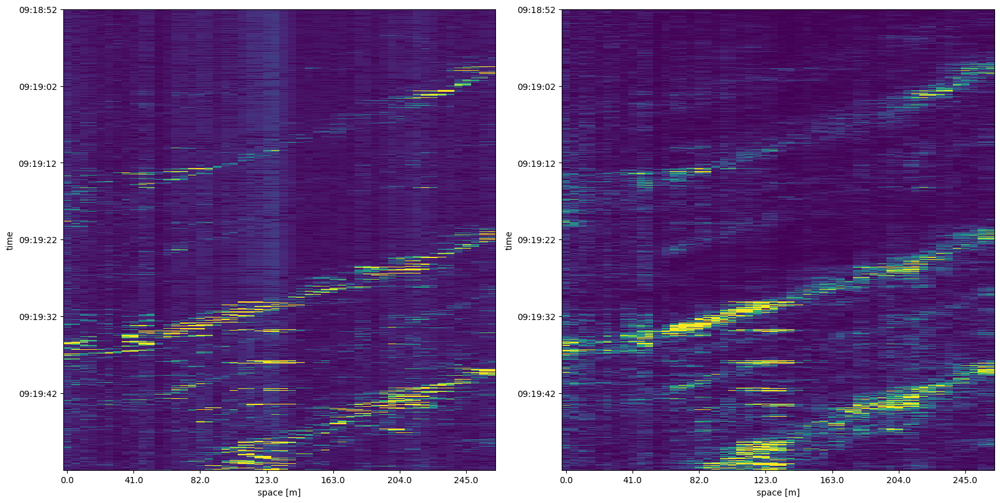

the data after the column normalizaiton on the left , the data before column normalization on the right


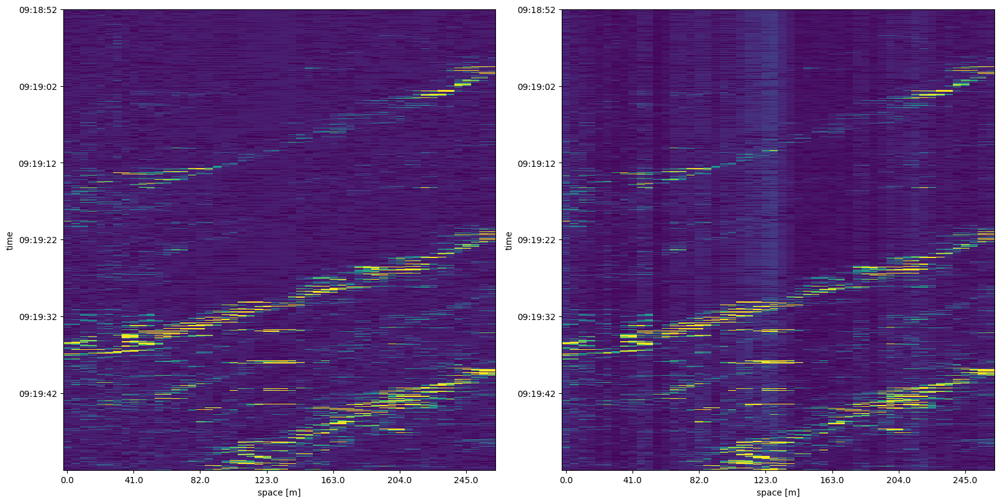

the data after the gamma_correction on the left , the data before the gamma_correction on the right


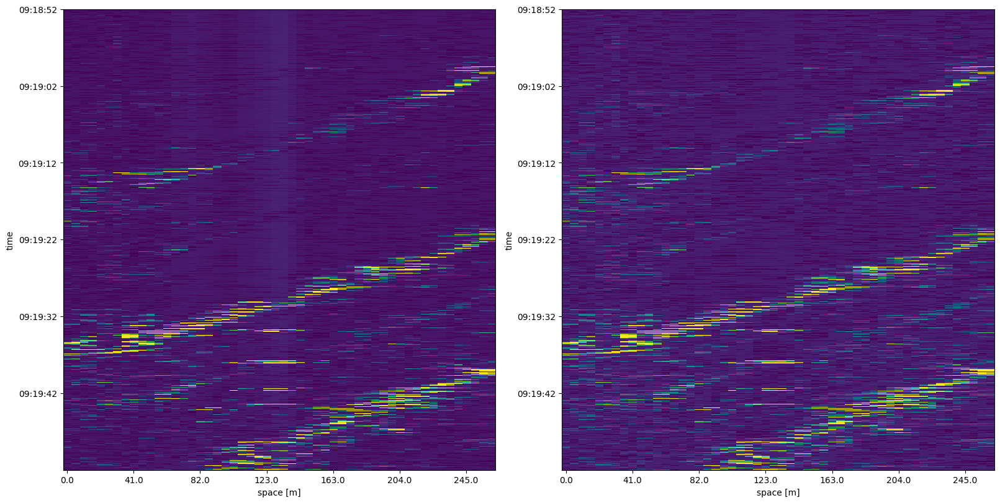

the data after the time doownsampling on the left and before the time downsampling on the right


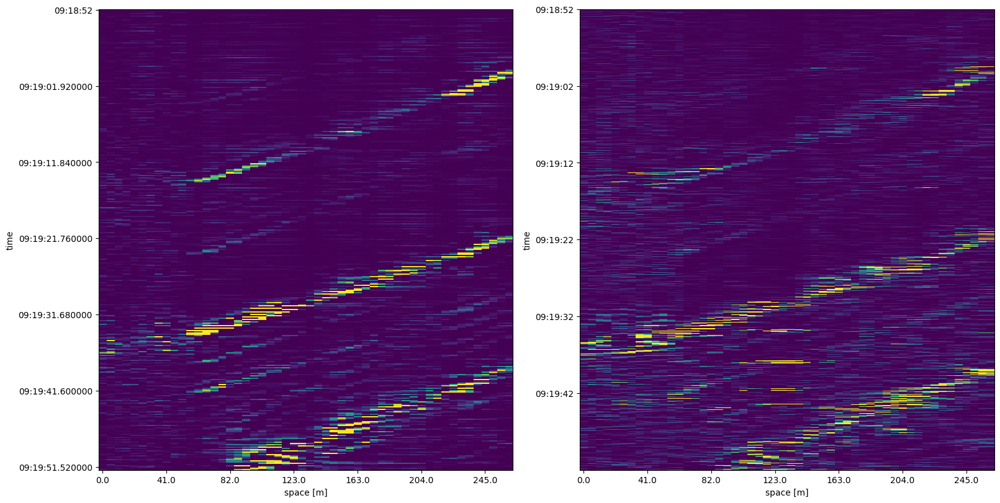

clipping the values above 97 percentile, to delete outliers, clipped image on the left


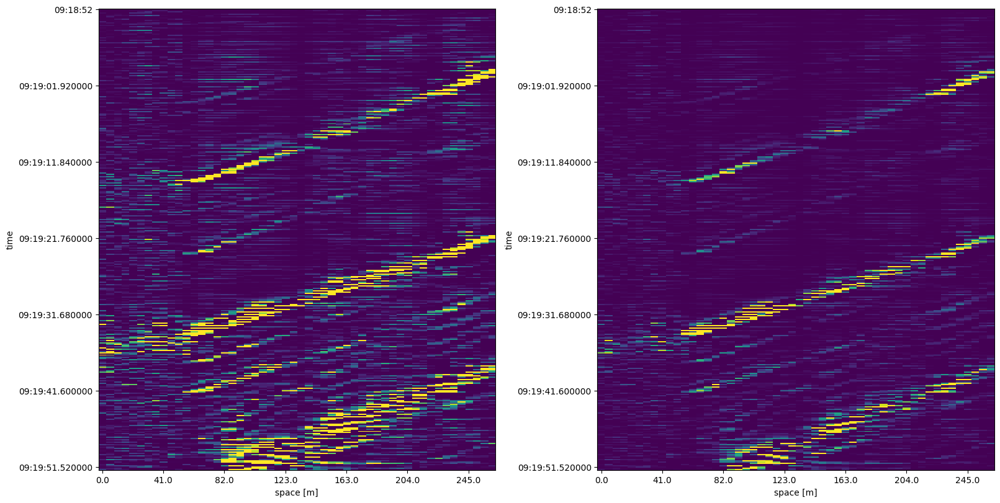

vertical sobel filter conducted to amplify the response of the vertical edges. Image after sobel on the left


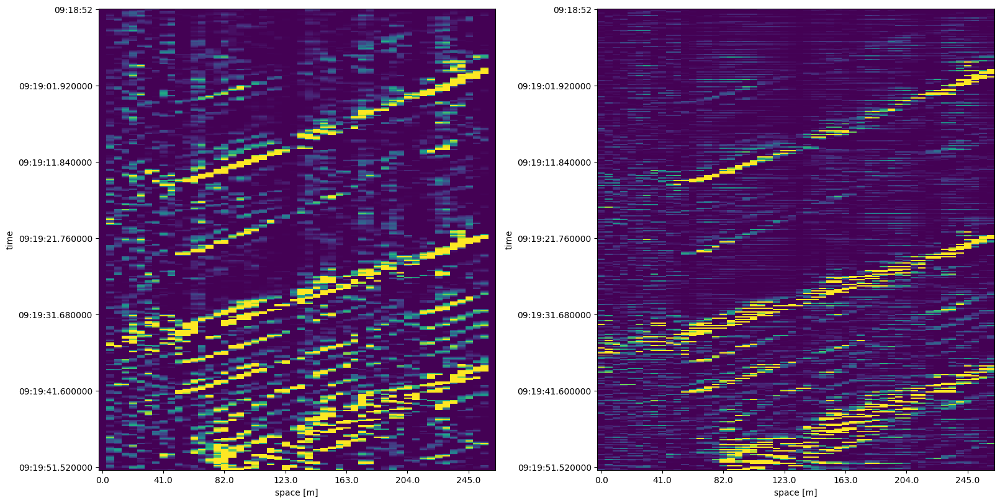

getting rid of the noise, setting, all the values below some percentile to 0,lowpass filter, the denosied image on the left


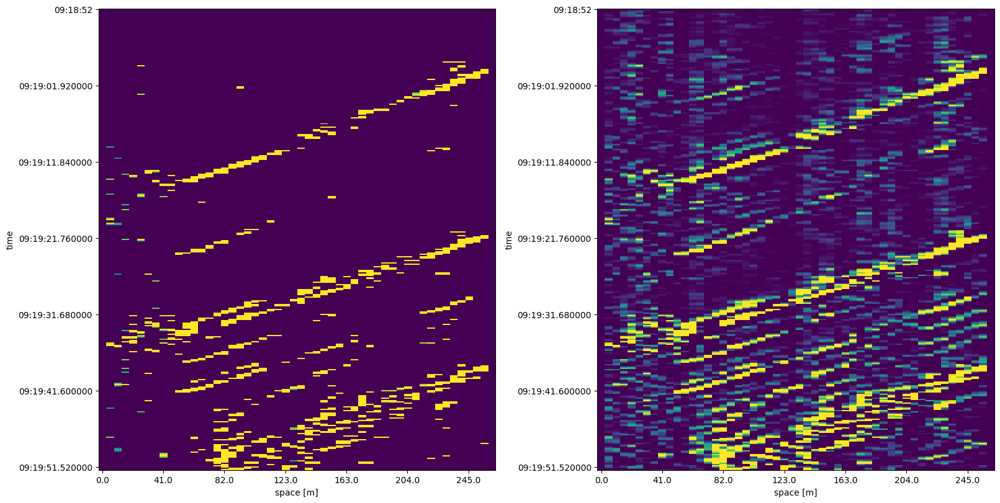

dilating the image 2x2 kernel , the dilated image on the left 


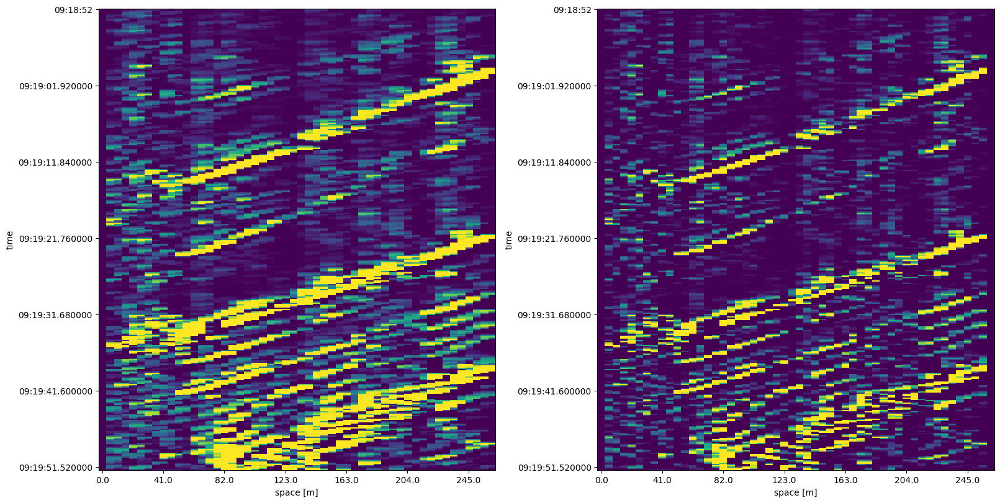

thresholding to keep only the pixrels with the strongest responses >99 percentile, the thresholded image on the left


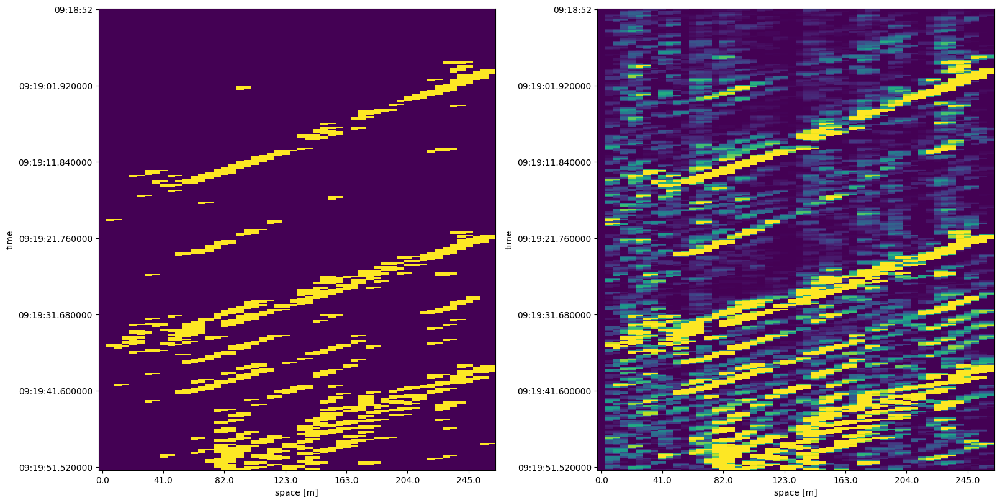

removing the noise , smallest contours which area is below some choosen  threshold are discarded, cleaned image on the left 


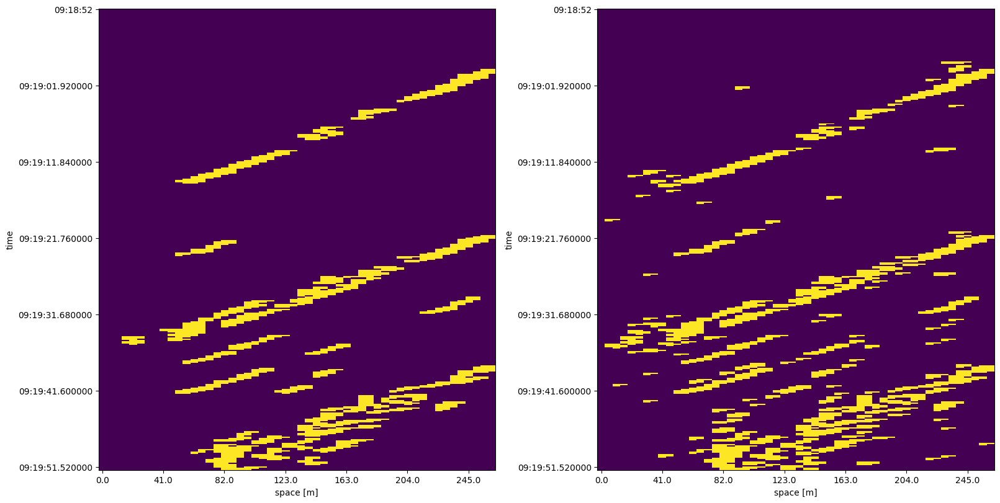

connecting components, by coloring points which have many colored points in the neighbourhood, connected image on the left


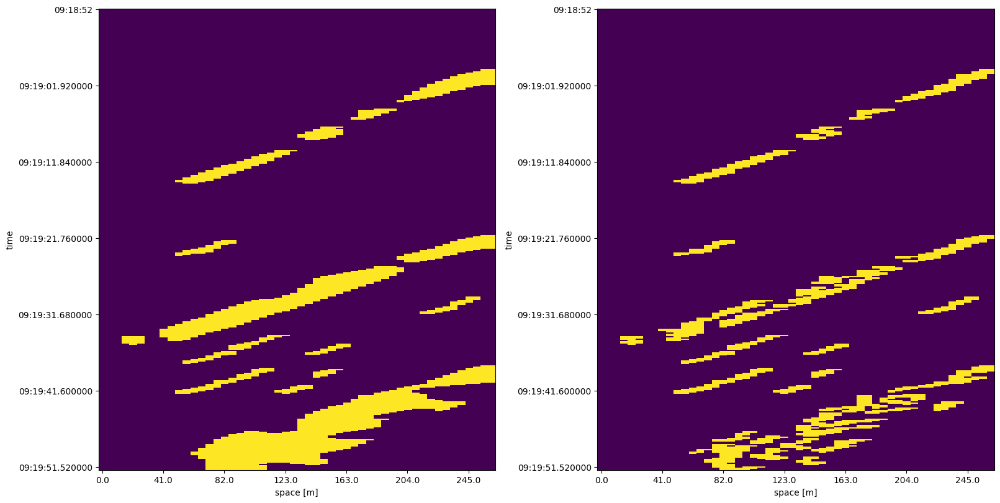

setting the lines of movements  as the furtherst points on the convex hull of the each contour


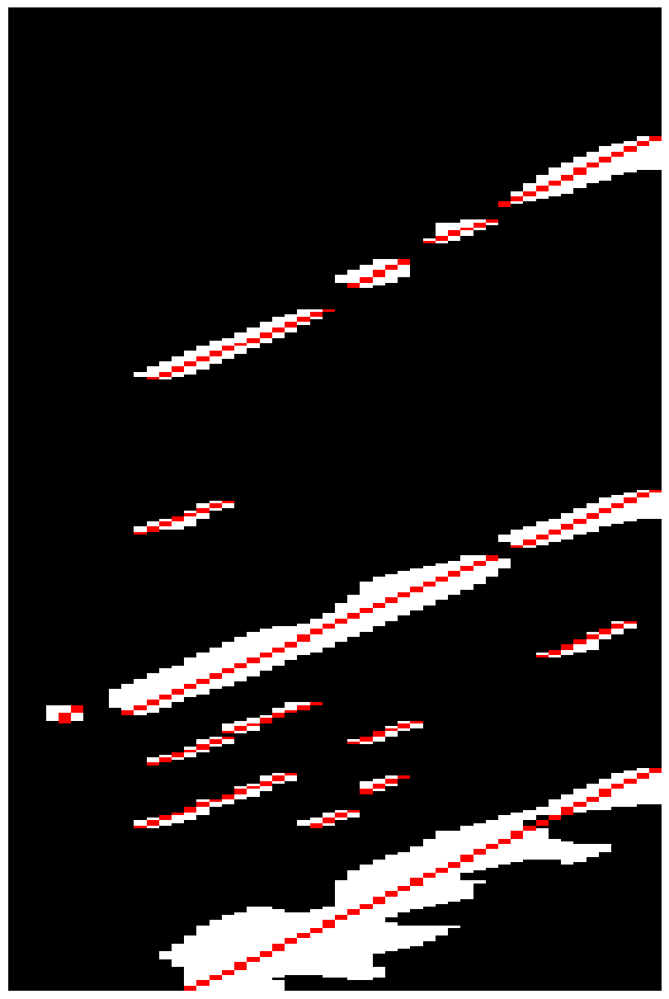

 custom algorithm performed which connects the lines   which can belong to the same vehicle


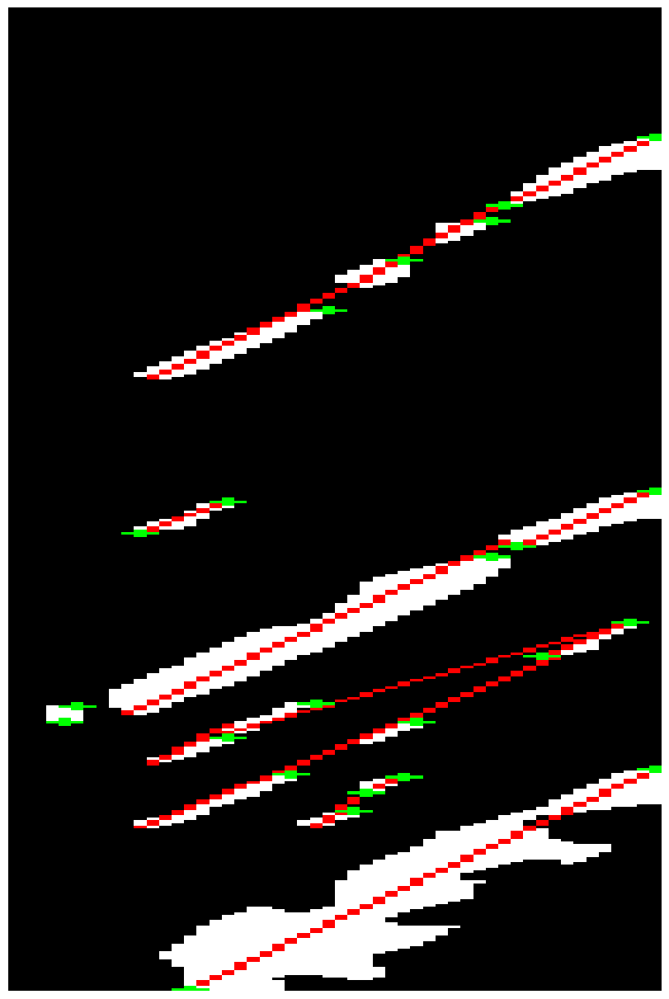

the velocity assesment for the single movements eg contours


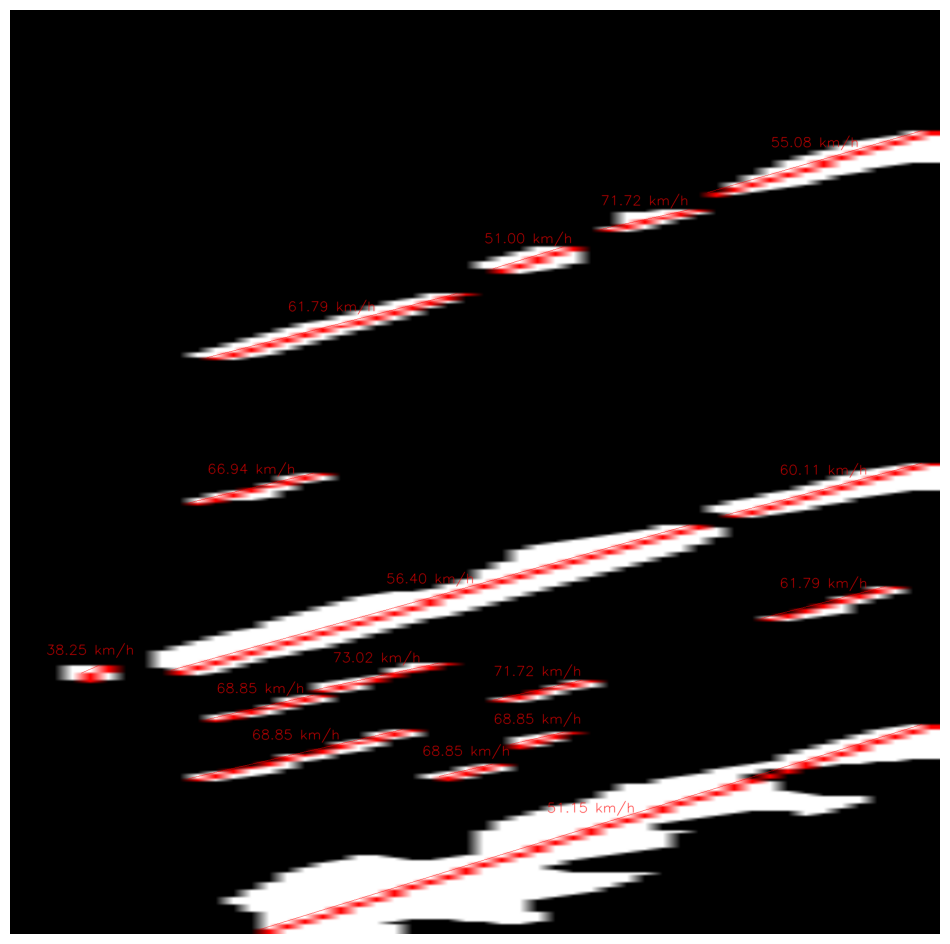

the velocity for the connected movement of vehicles, i.e single movements were connected into movement of one vehicle 


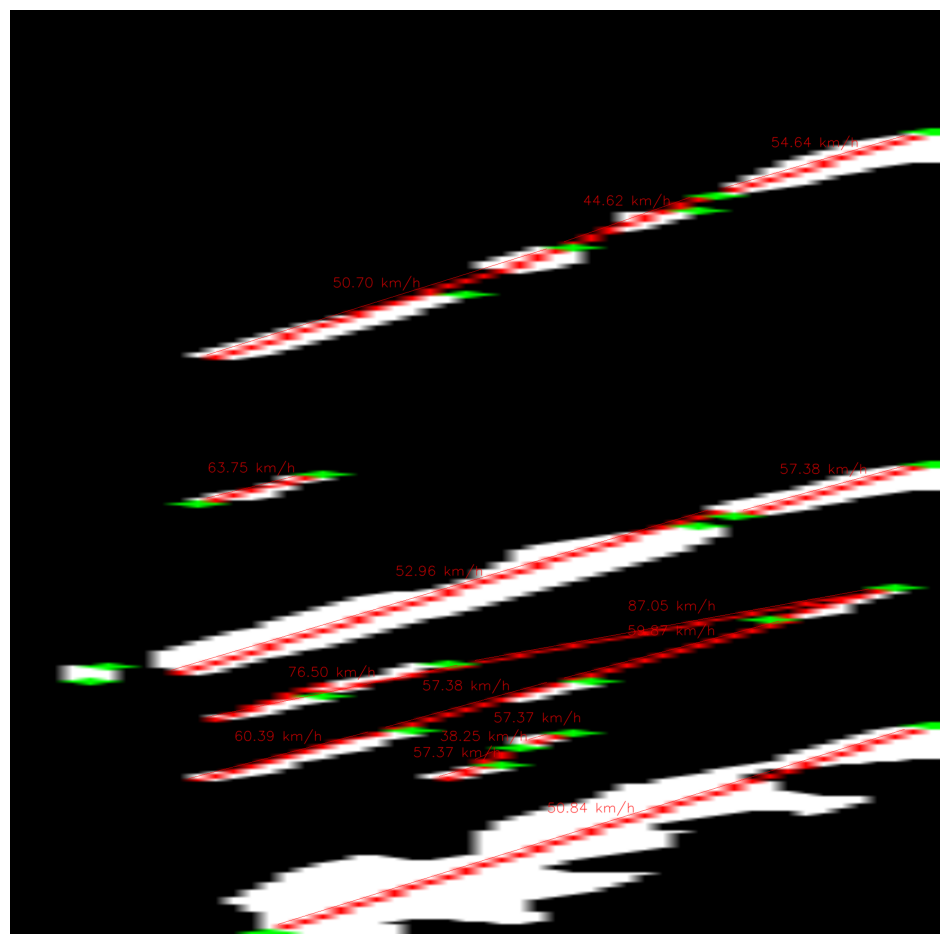

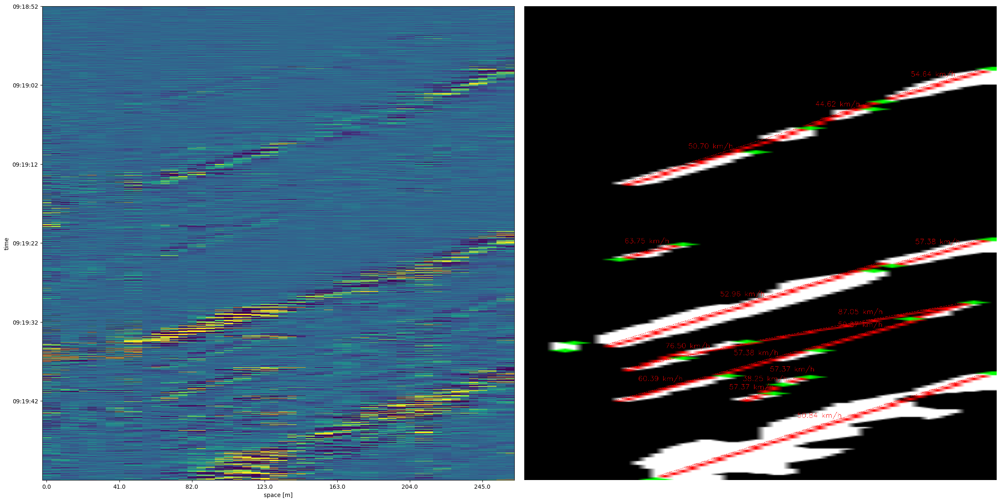

finished processing  of this example





















the data after the denoising on the left, the data before the denoising on the right


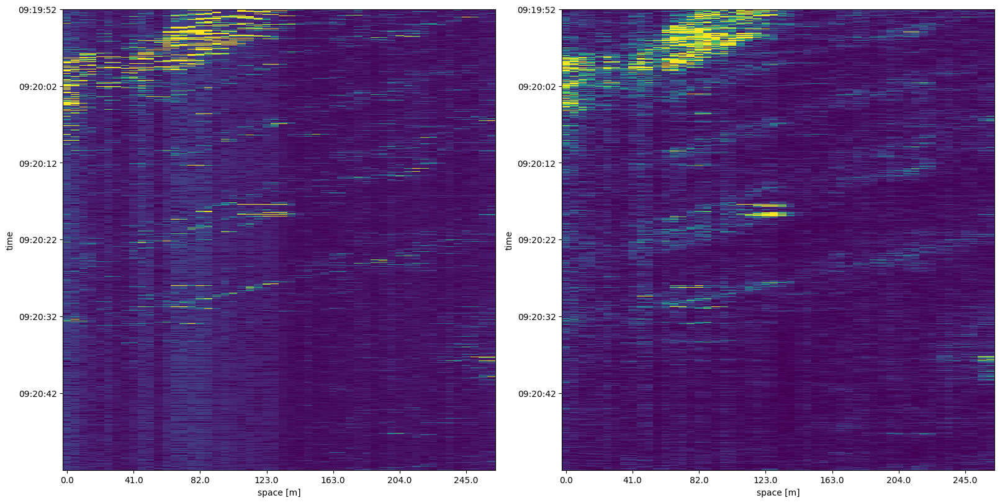

the data after the column normalizaiton on the left , the data before column normalization on the right


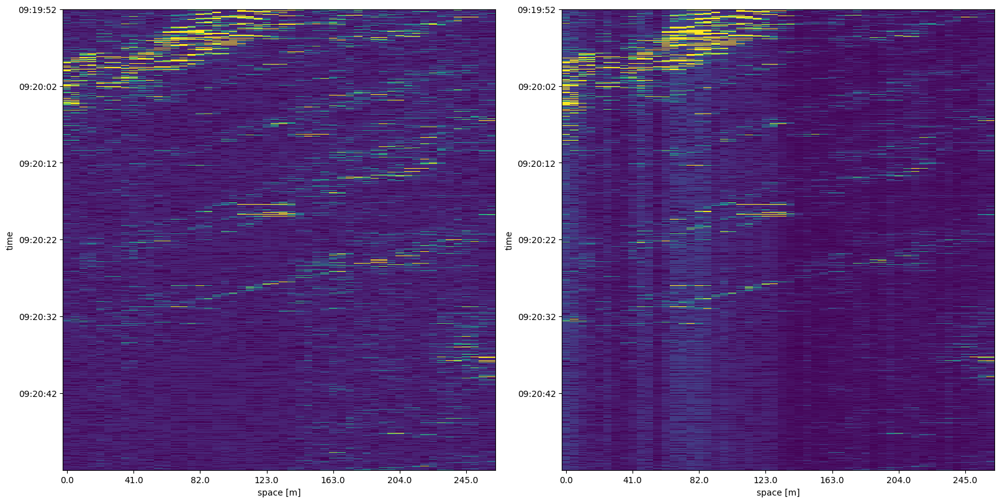

the data after the gamma_correction on the left , the data before the gamma_correction on the right


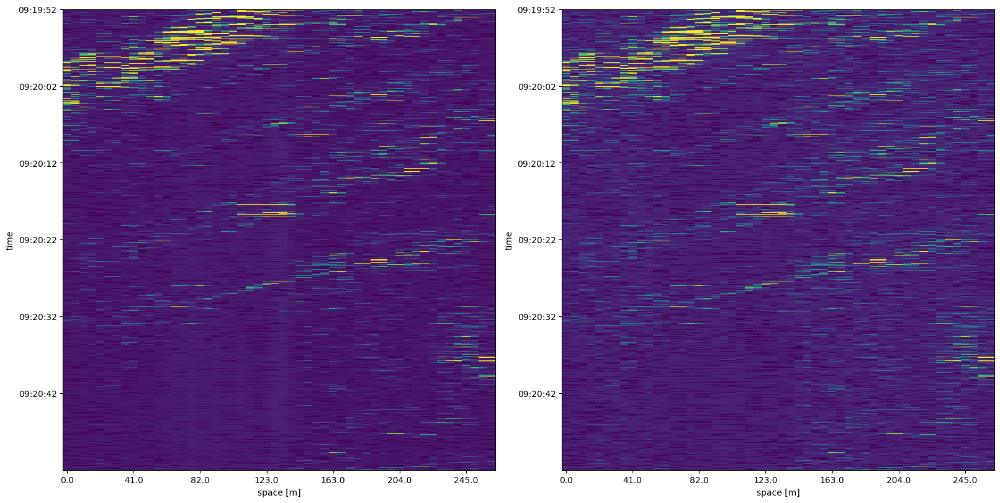

the data after the time doownsampling on the left and before the time downsampling on the right


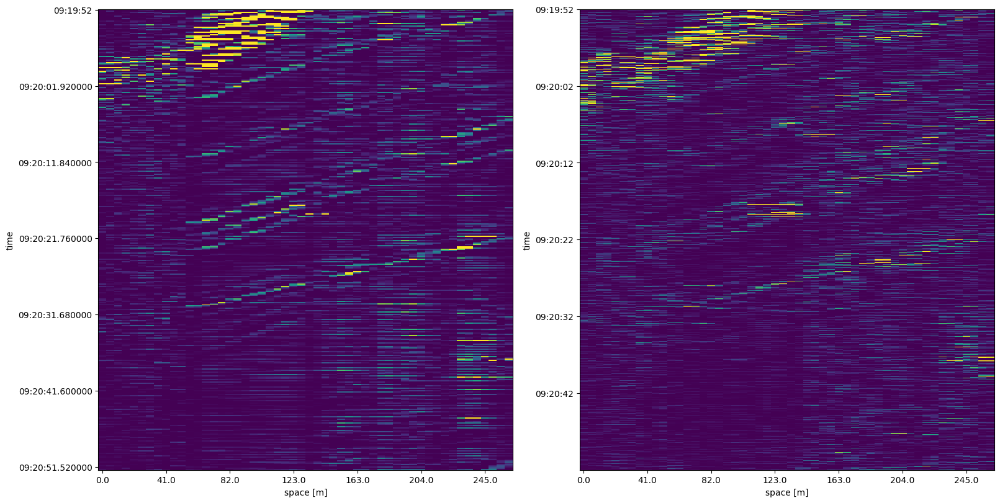

clipping the values above 97 percentile, to delete outliers, clipped image on the left


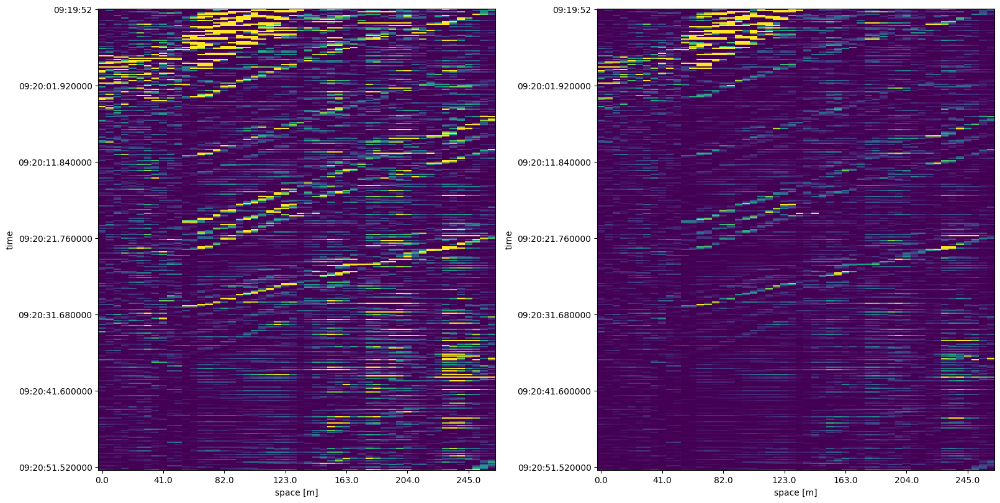

vertical sobel filter conducted to amplify the response of the vertical edges. Image after sobel on the left


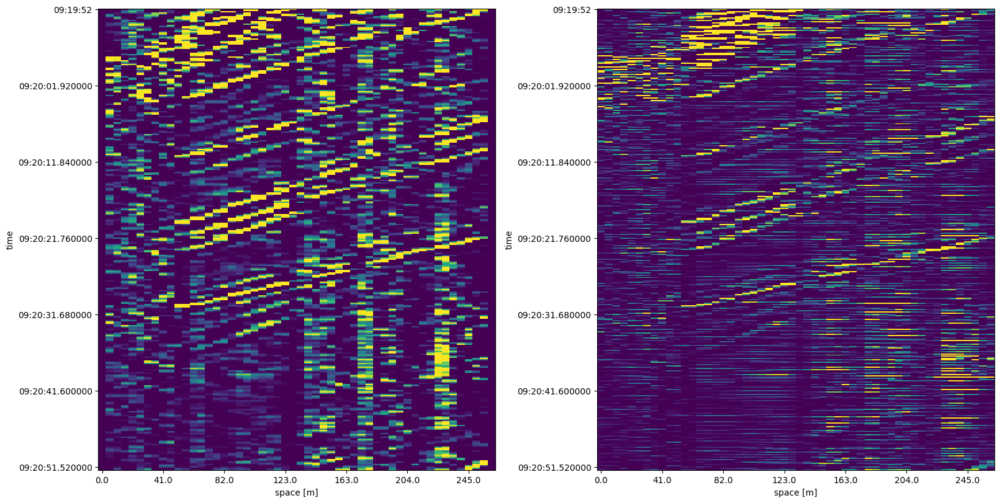

getting rid of the noise, setting, all the values below some percentile to 0,lowpass filter, the denosied image on the left


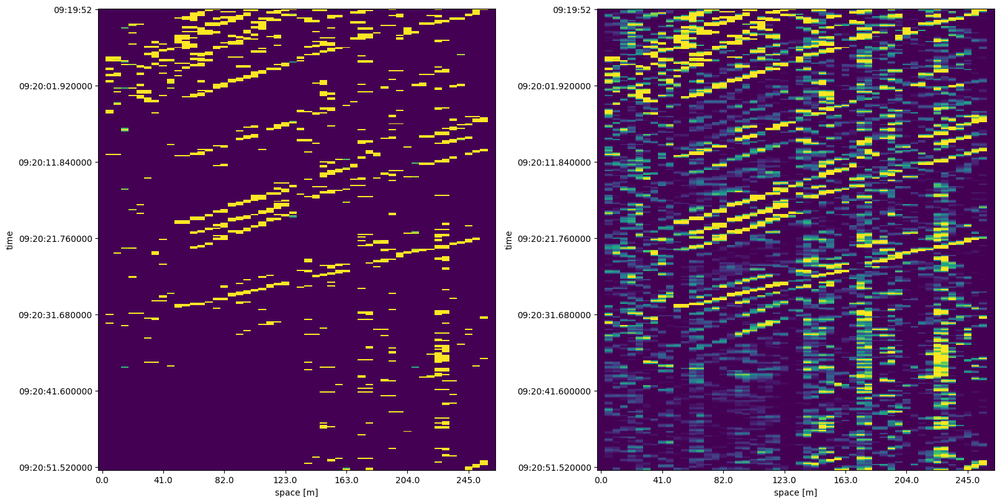

dilating the image 2x2 kernel , the dilated image on the left 


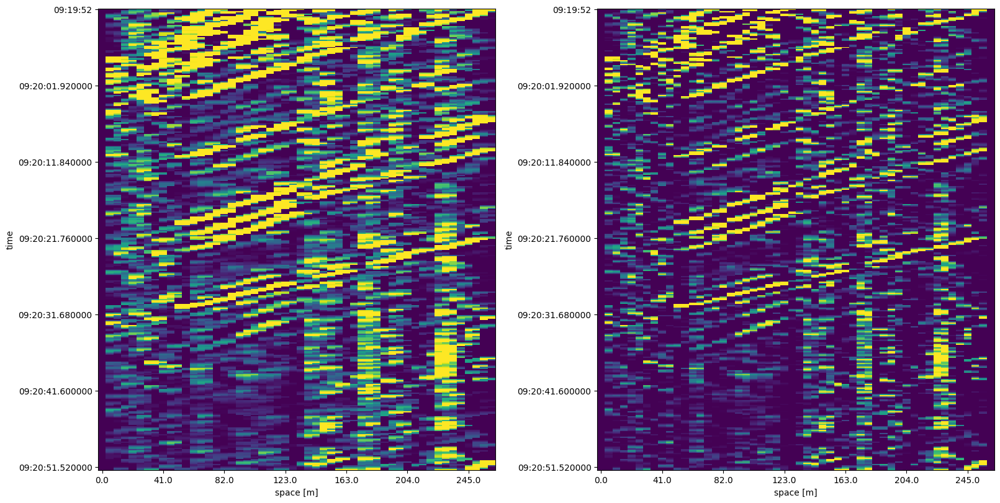

thresholding to keep only the pixrels with the strongest responses >99 percentile, the thresholded image on the left


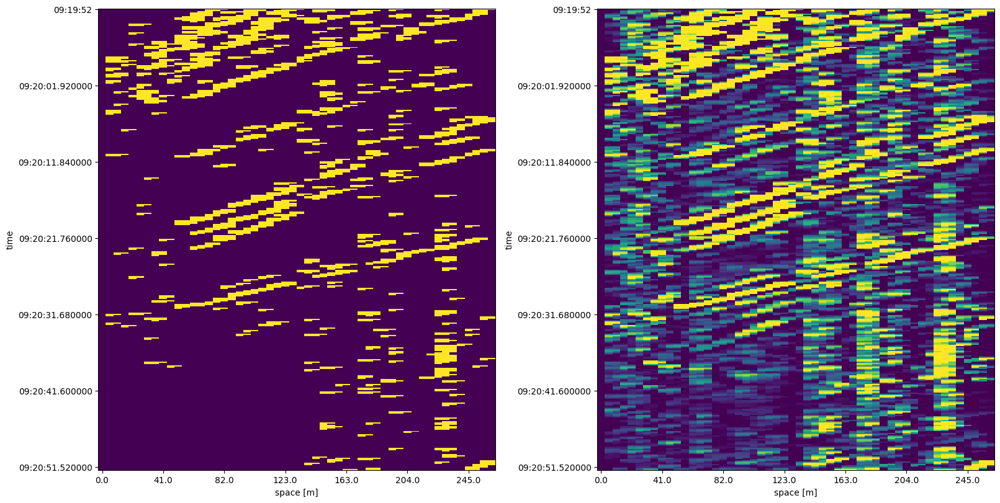

removing the noise , smallest contours which area is below some choosen  threshold are discarded, cleaned image on the left 


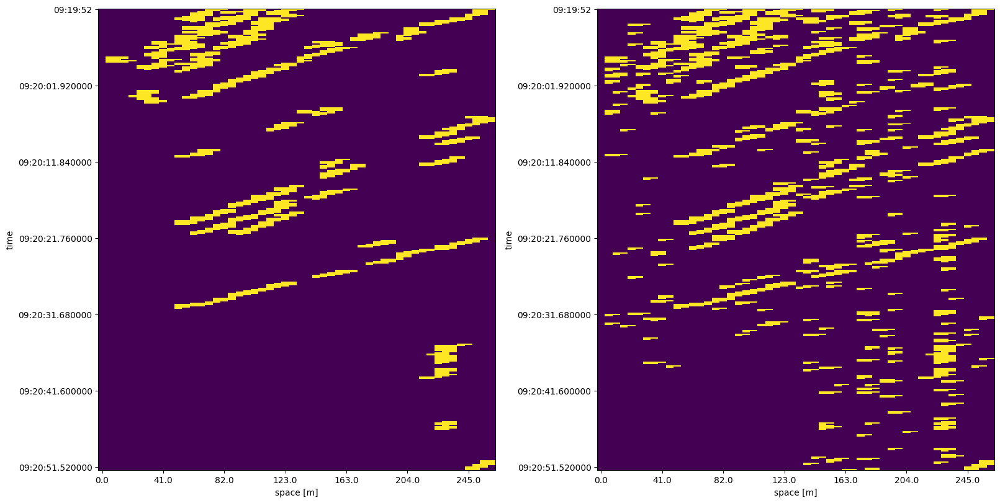

connecting components, by coloring points which have many colored points in the neighbourhood, connected image on the left


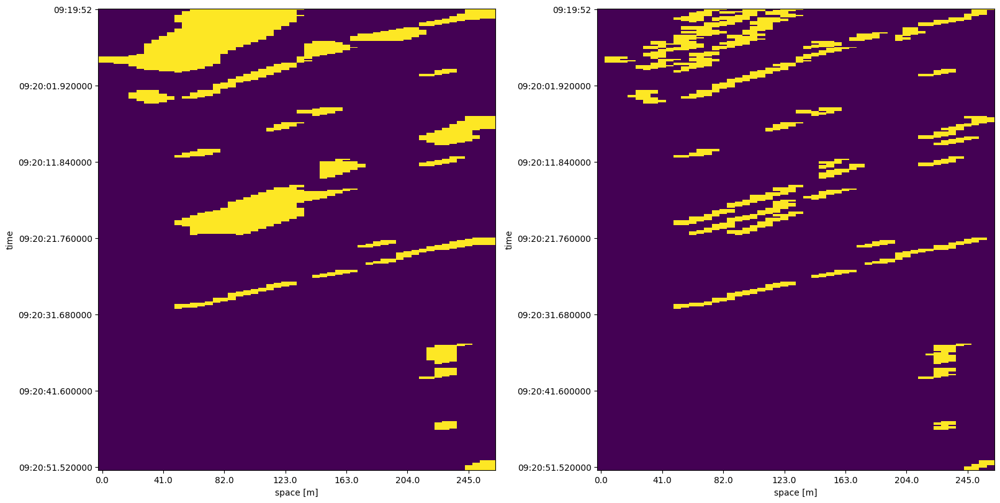

setting the lines of movements  as the furtherst points on the convex hull of the each contour


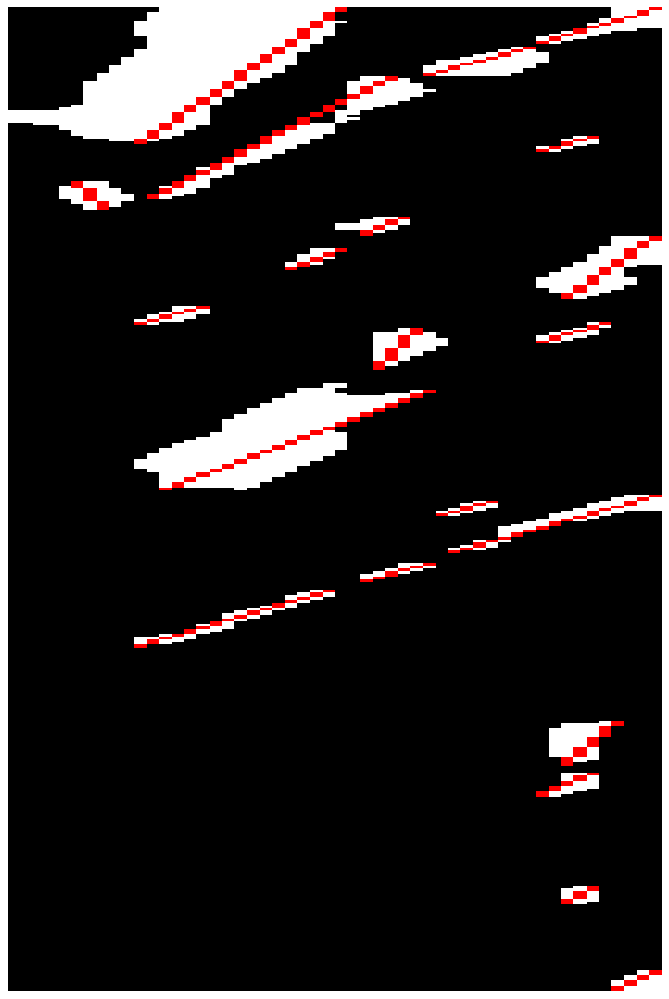

 custom algorithm performed which connects the lines   which can belong to the same vehicle


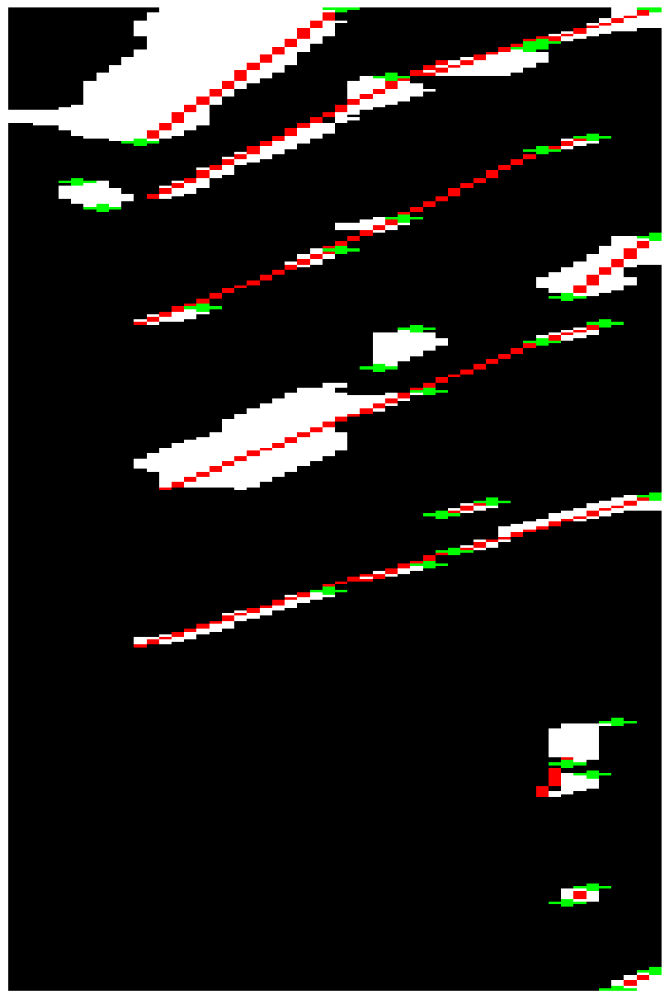

the velocity assesment for the single movements eg contours


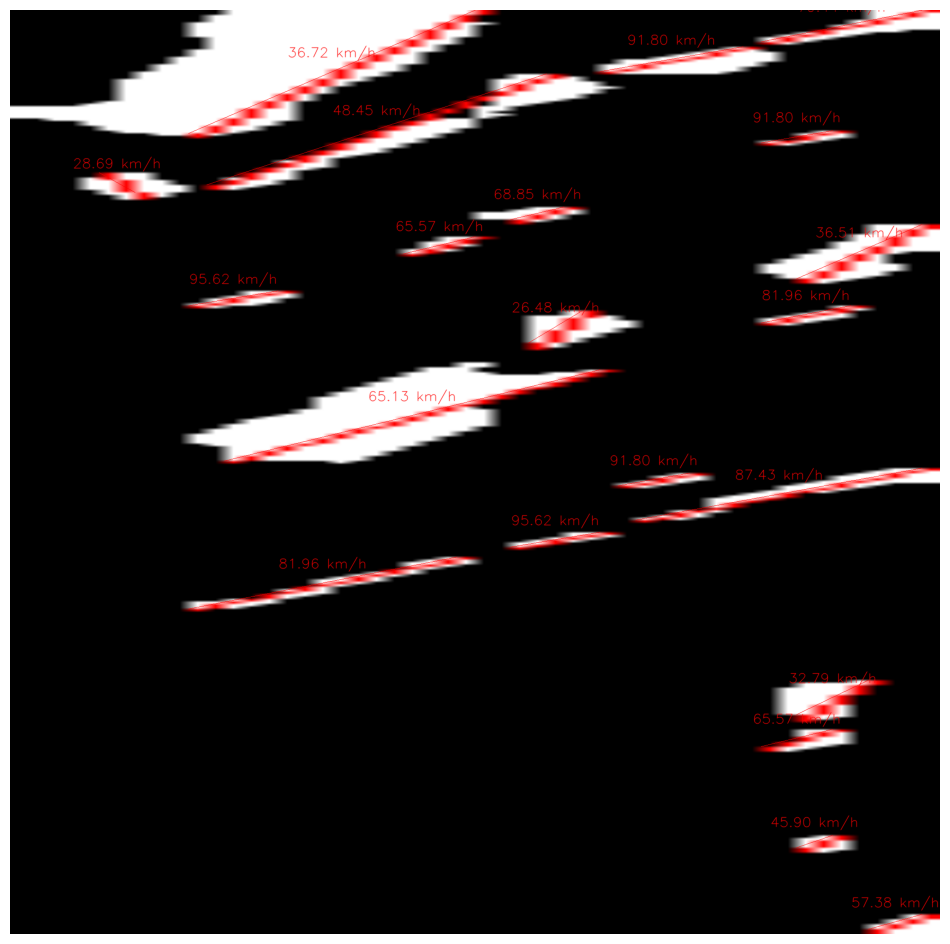

the velocity for the connected movement of vehicles, i.e single movements were connected into movement of one vehicle 


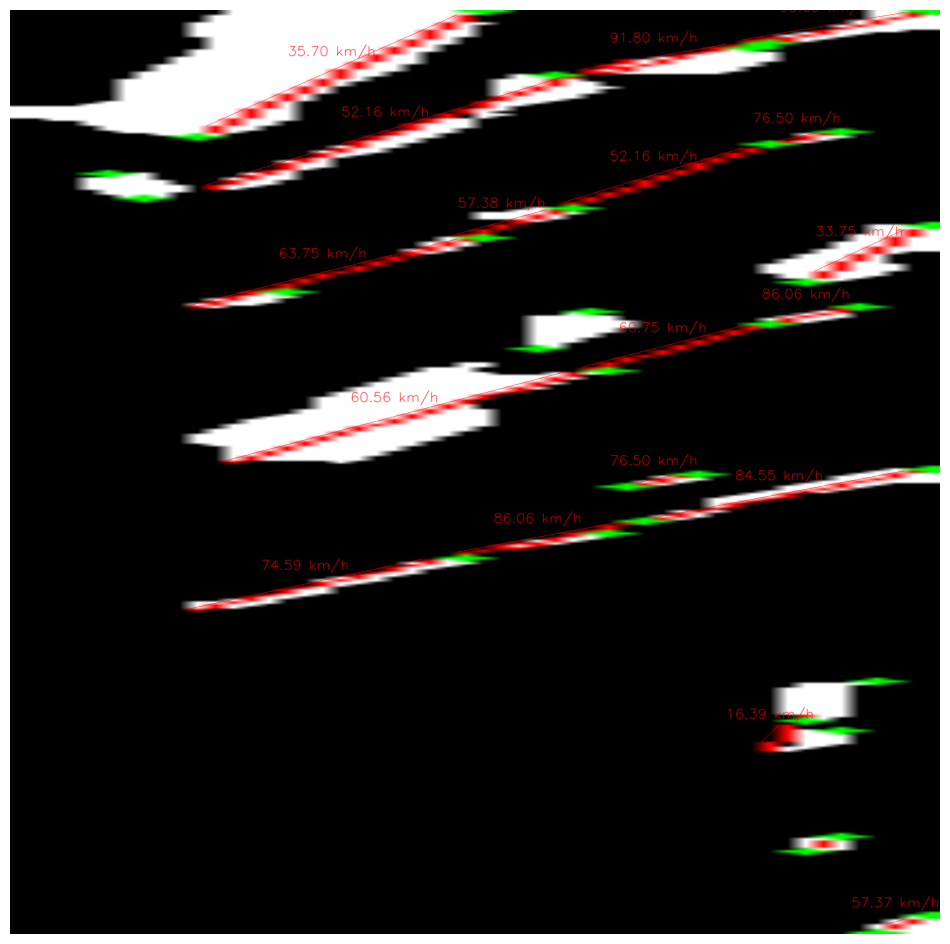

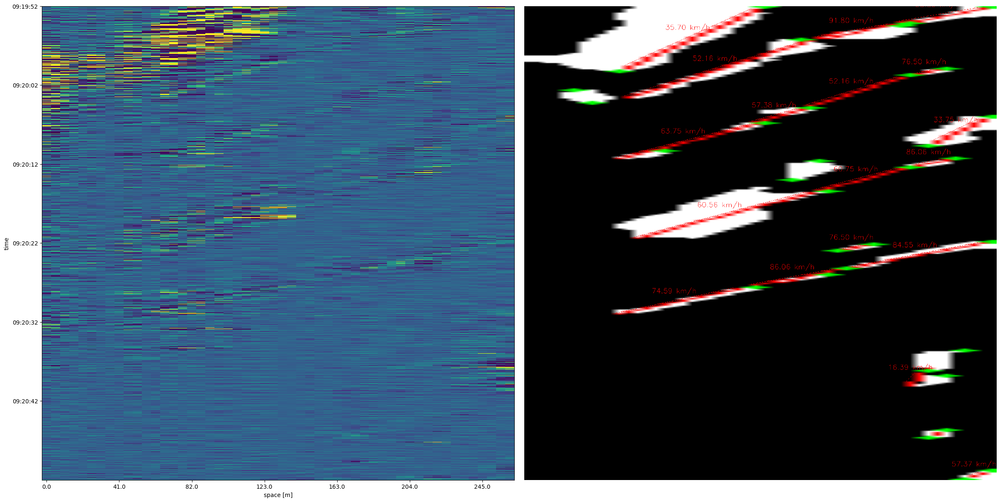

finished processing  of this example





















the data after the denoising on the left, the data before the denoising on the right


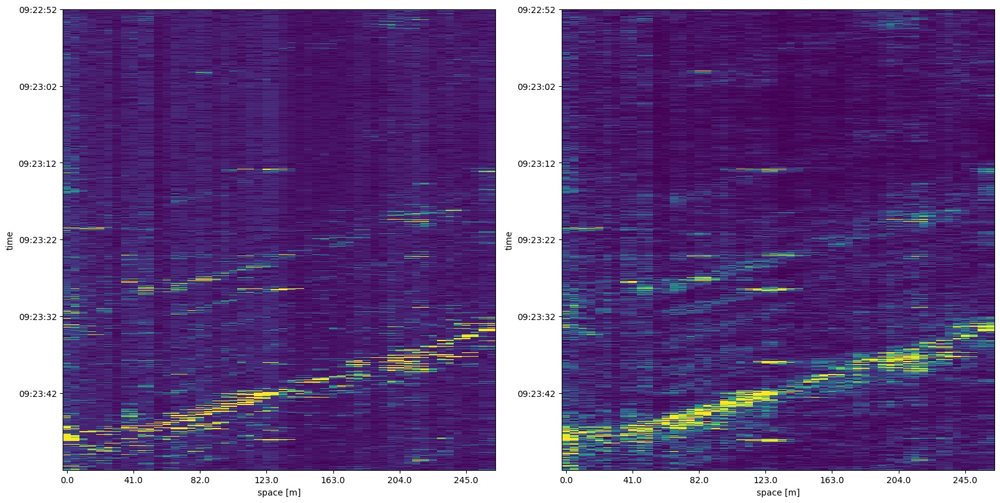

the data after the column normalizaiton on the left , the data before column normalization on the right


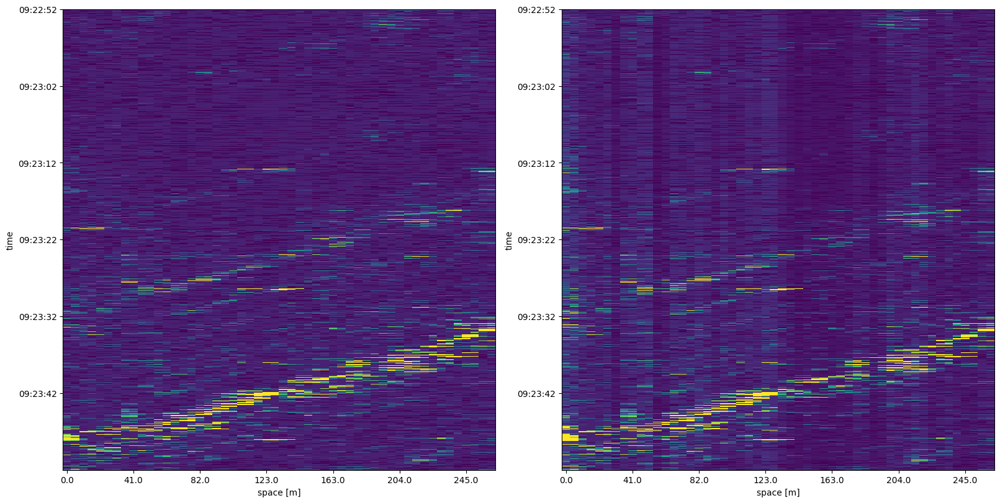

the data after the gamma_correction on the left , the data before the gamma_correction on the right


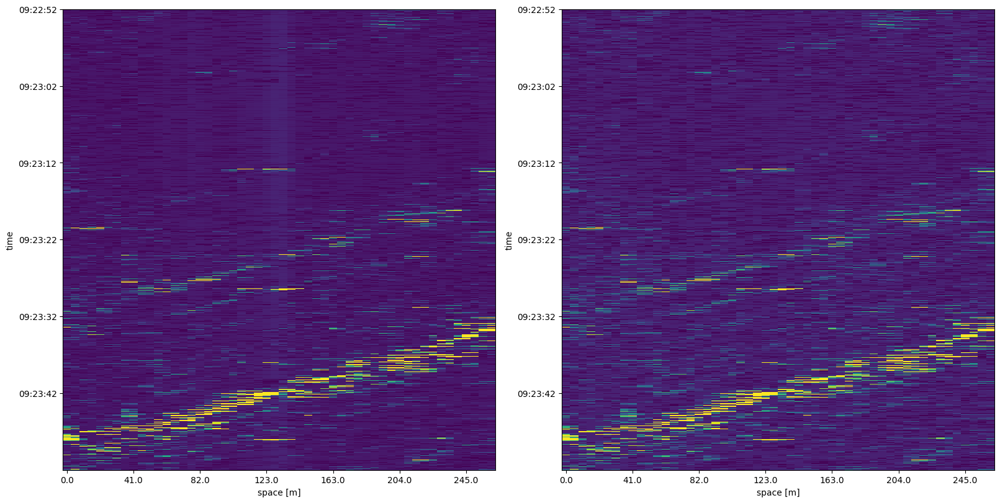

the data after the time doownsampling on the left and before the time downsampling on the right


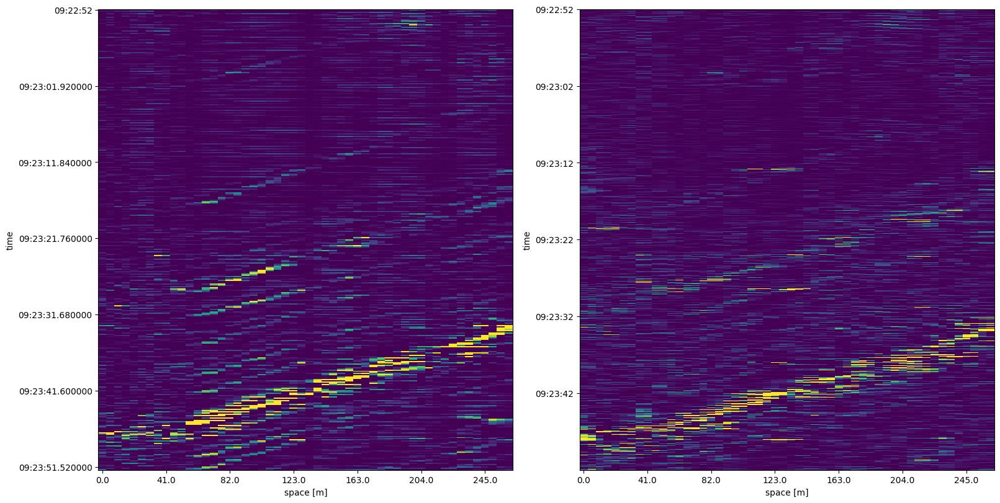

clipping the values above 97 percentile, to delete outliers, clipped image on the left


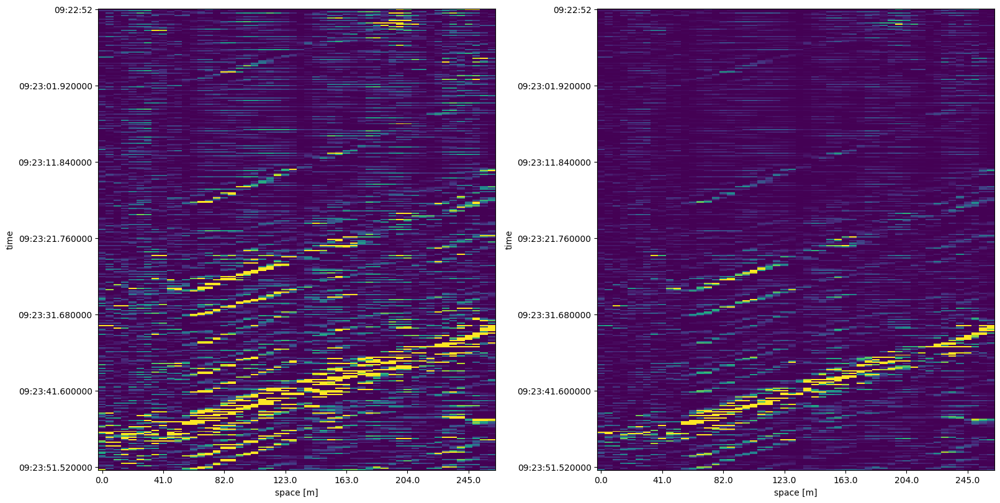

vertical sobel filter conducted to amplify the response of the vertical edges. Image after sobel on the left


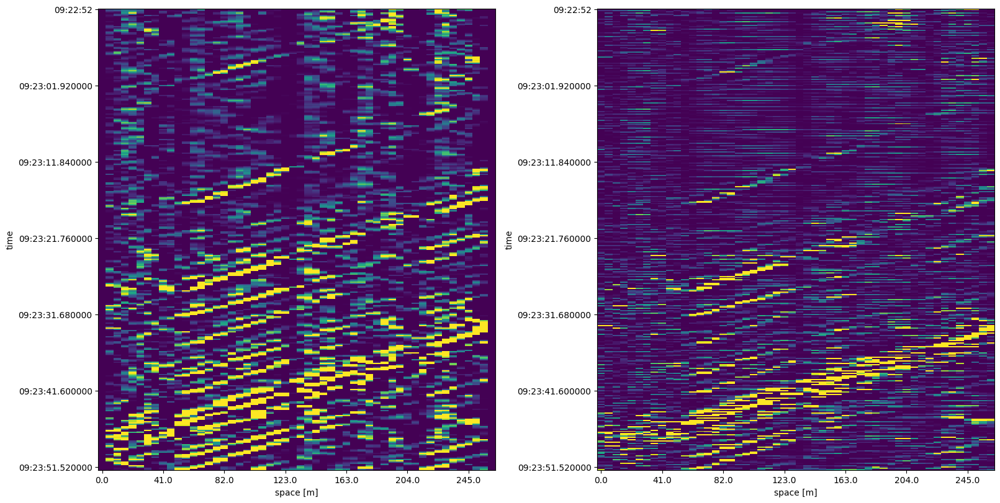

getting rid of the noise, setting, all the values below some percentile to 0,lowpass filter, the denosied image on the left


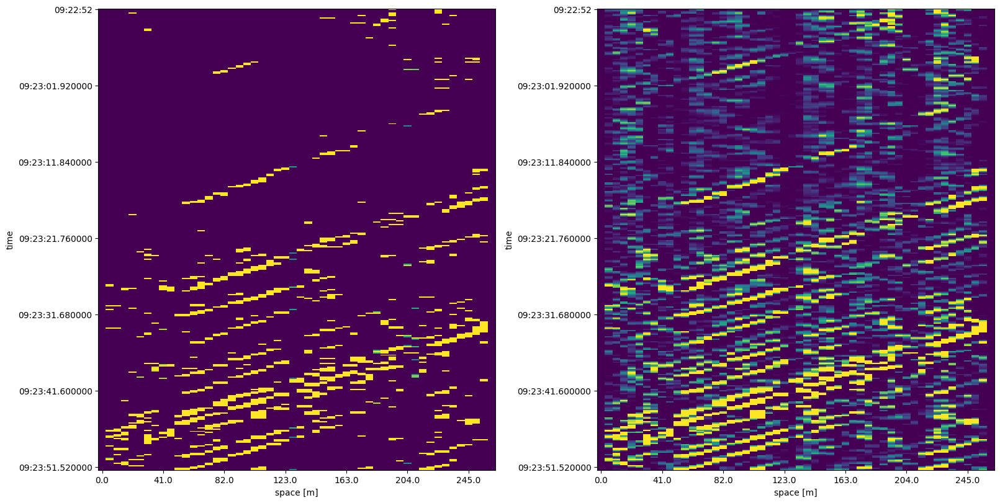

dilating the image 2x2 kernel , the dilated image on the left 


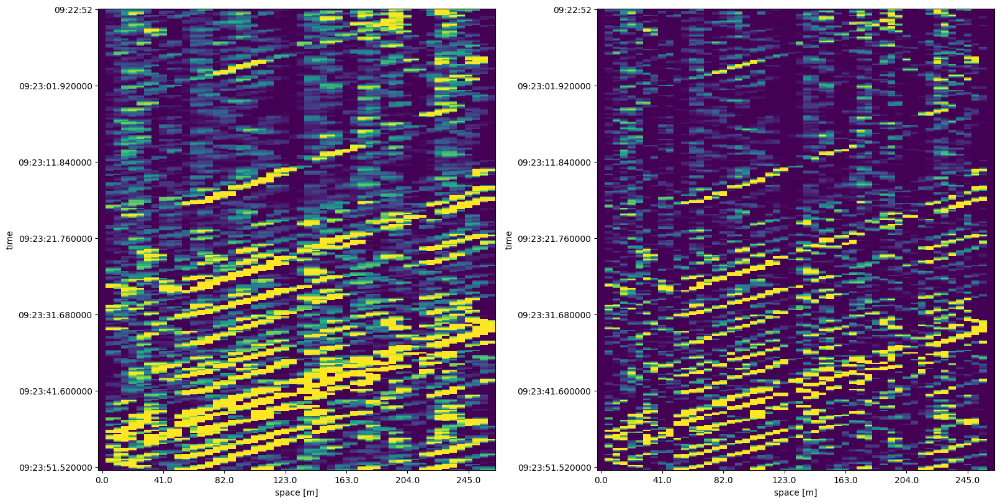

thresholding to keep only the pixrels with the strongest responses >99 percentile, the thresholded image on the left


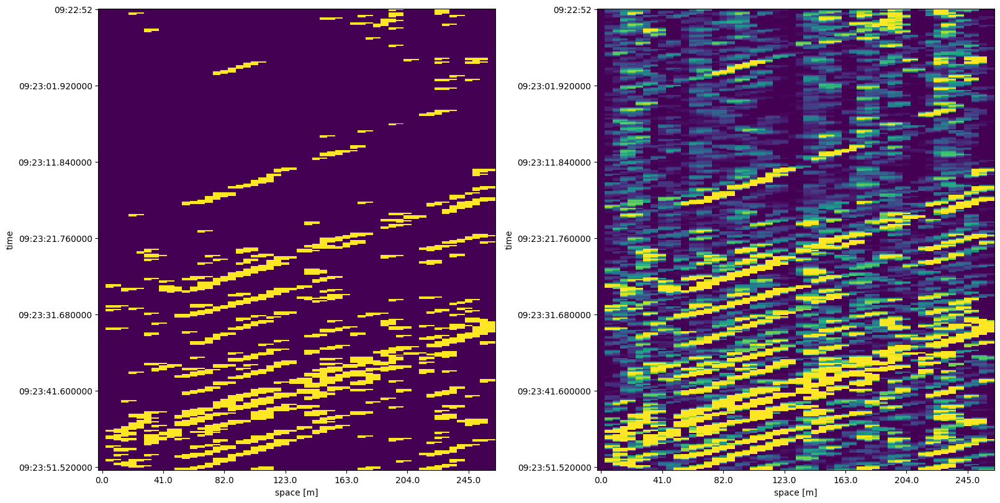

removing the noise , smallest contours which area is below some choosen  threshold are discarded, cleaned image on the left 


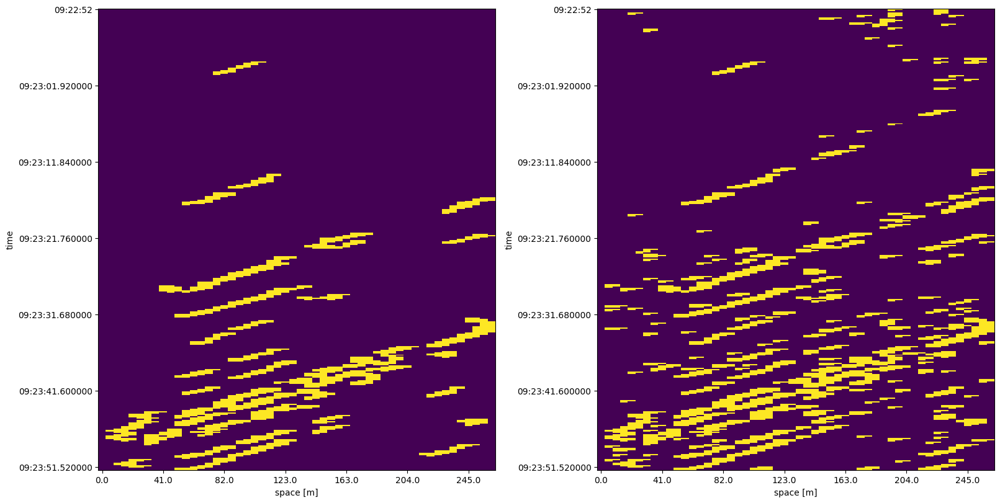

connecting components, by coloring points which have many colored points in the neighbourhood, connected image on the left


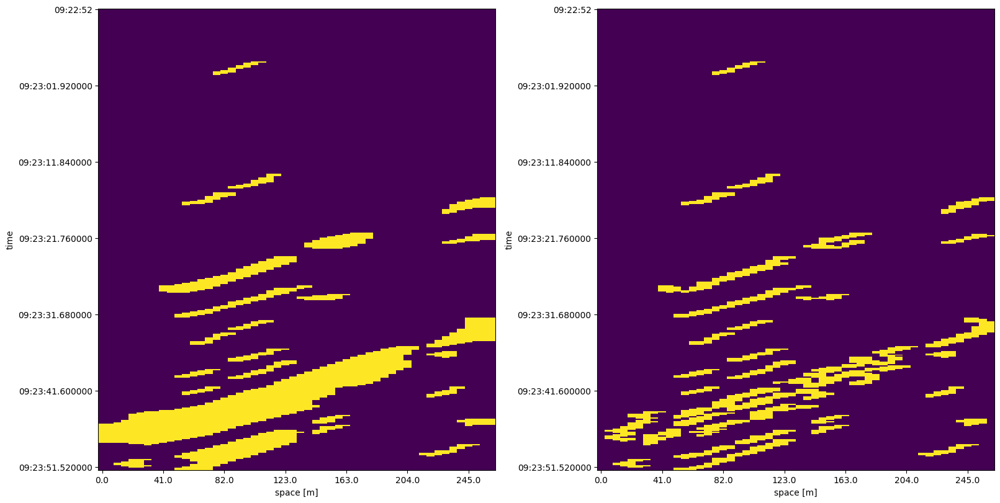

setting the lines of movements  as the furtherst points on the convex hull of the each contour


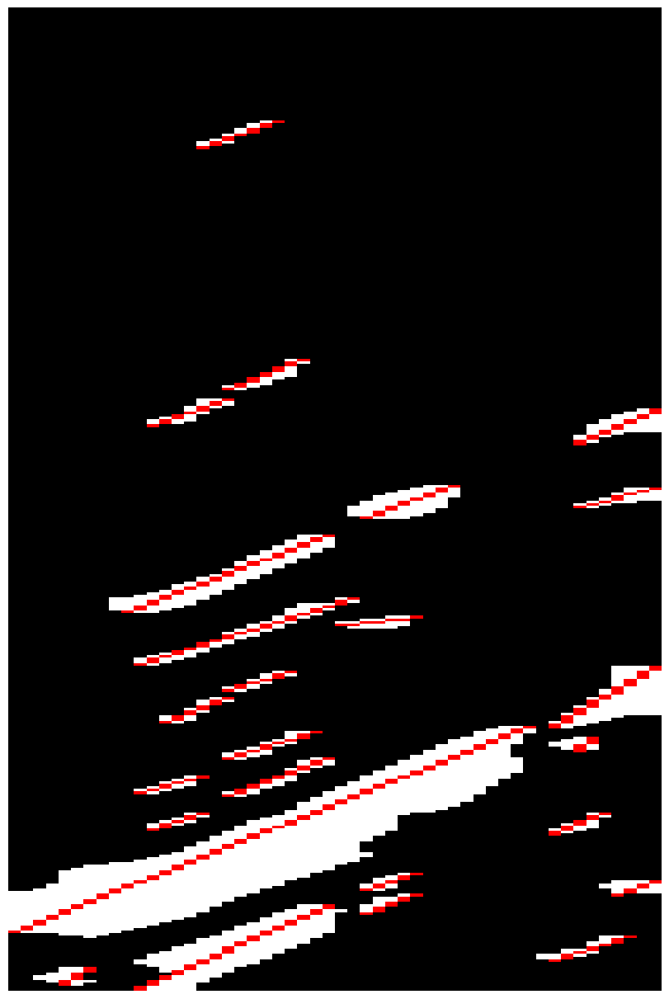

 custom algorithm performed which connects the lines   which can belong to the same vehicle


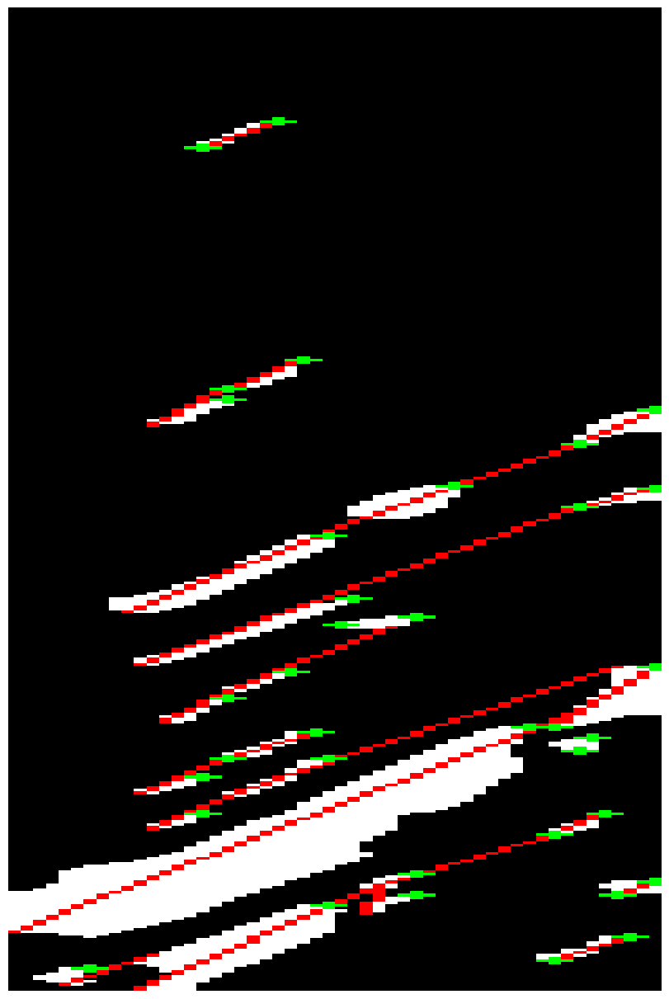

the velocity assesment for the single movements eg contours


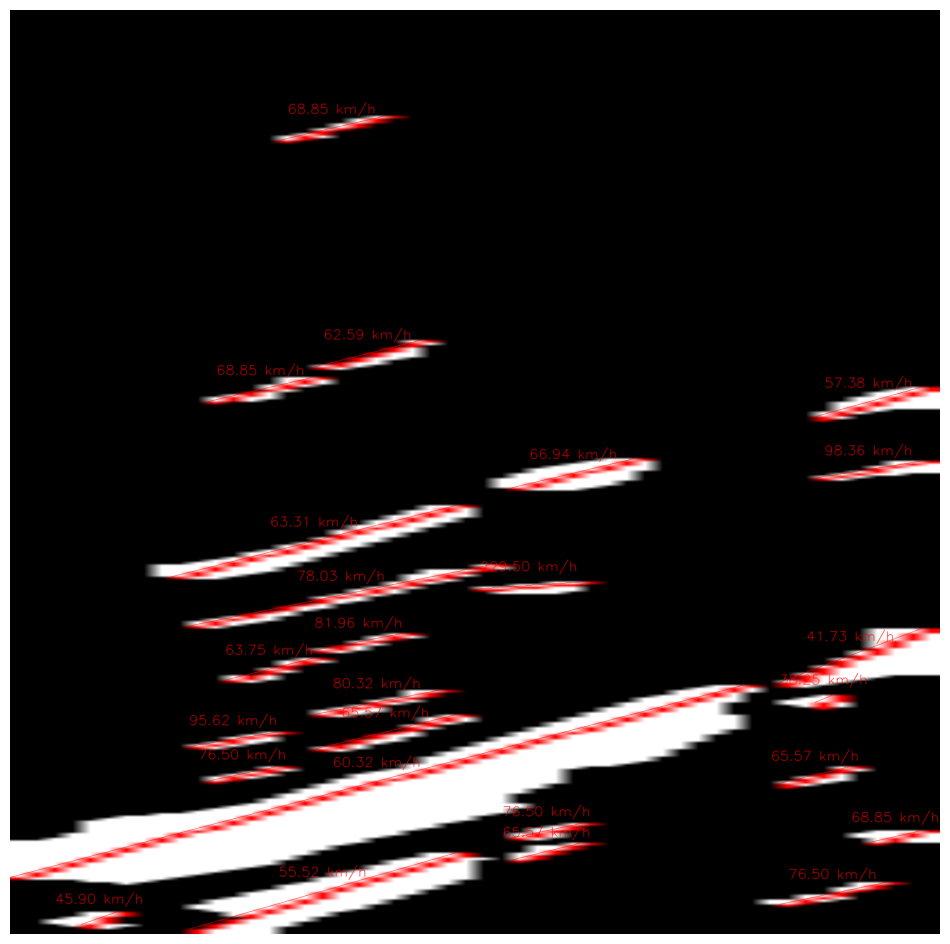

the velocity for the connected movement of vehicles, i.e single movements were connected into movement of one vehicle 


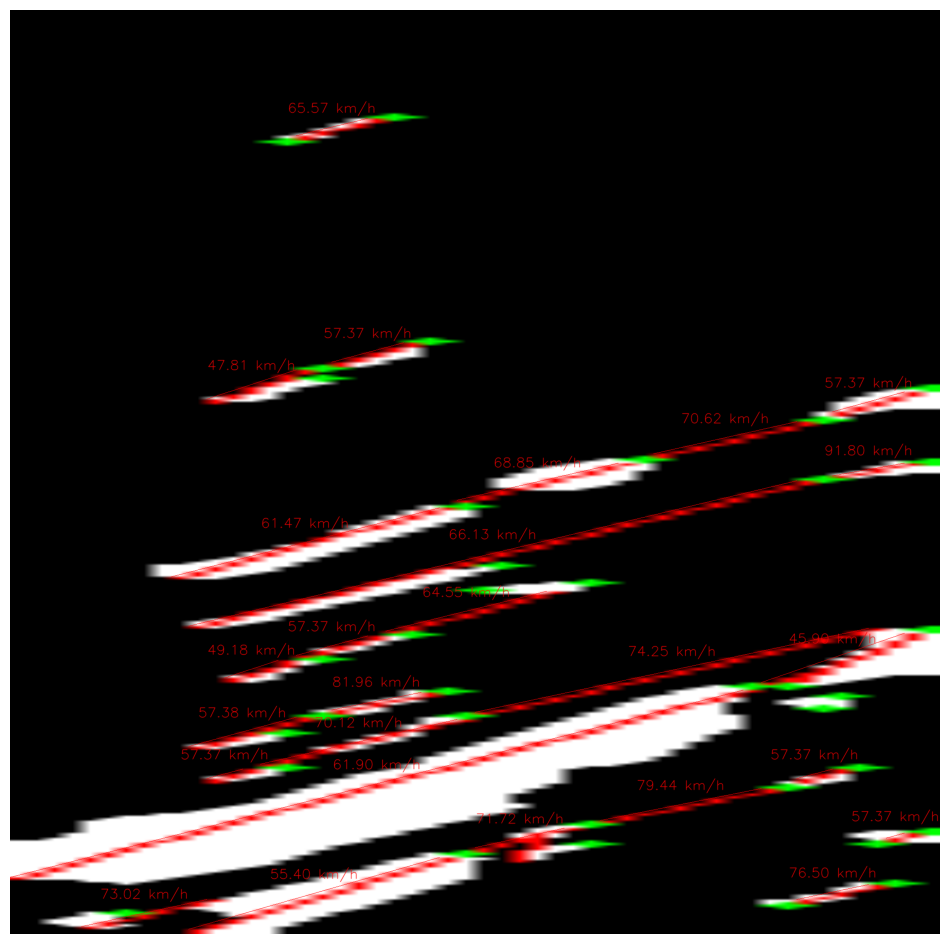

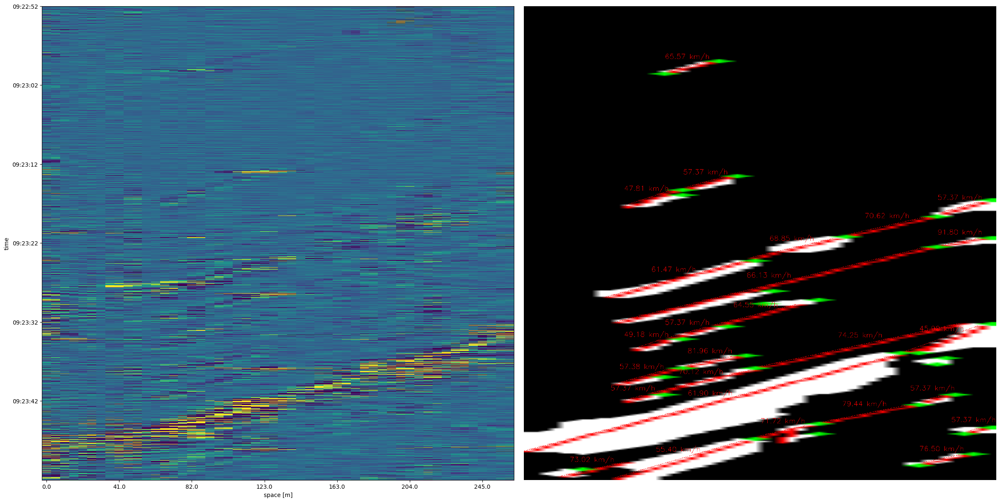

finished processing  of this example





















the data after the denoising on the left, the data before the denoising on the right


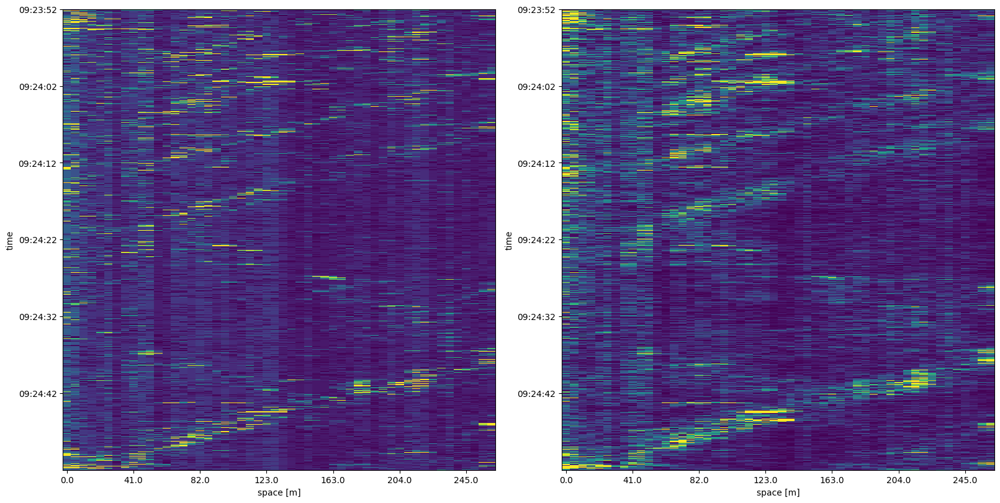

the data after the column normalizaiton on the left , the data before column normalization on the right


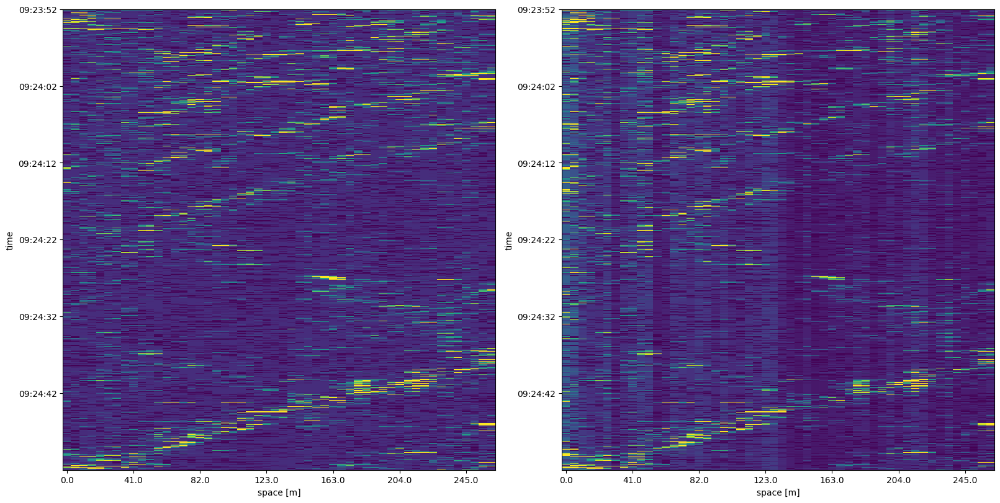

the data after the gamma_correction on the left , the data before the gamma_correction on the right


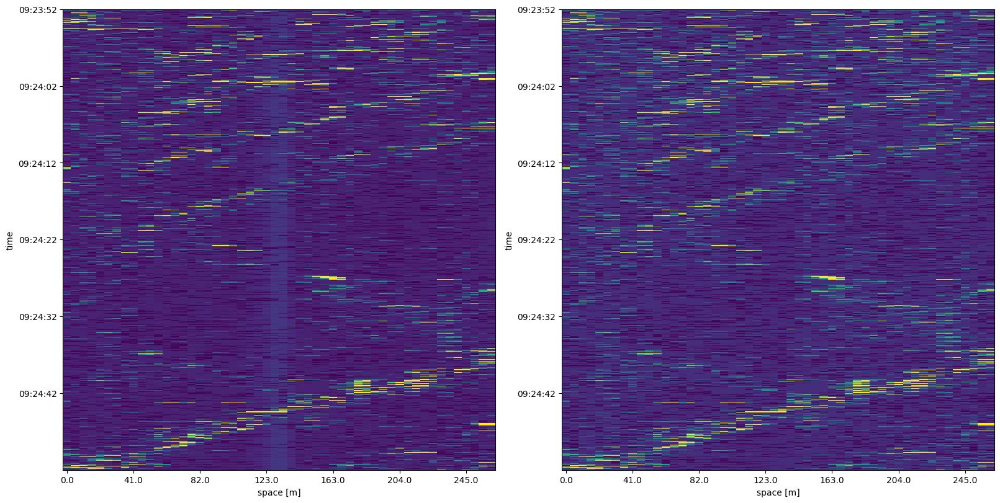

the data after the time doownsampling on the left and before the time downsampling on the right


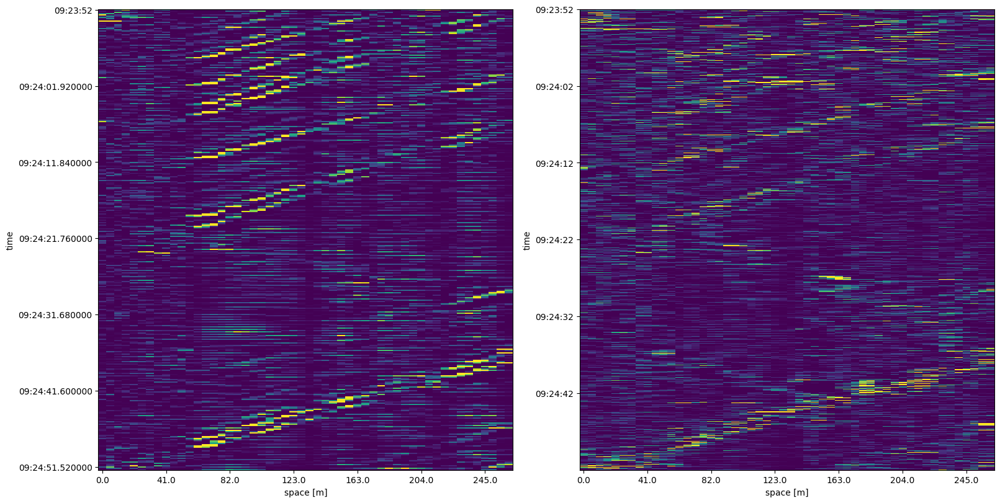

clipping the values above 97 percentile, to delete outliers, clipped image on the left


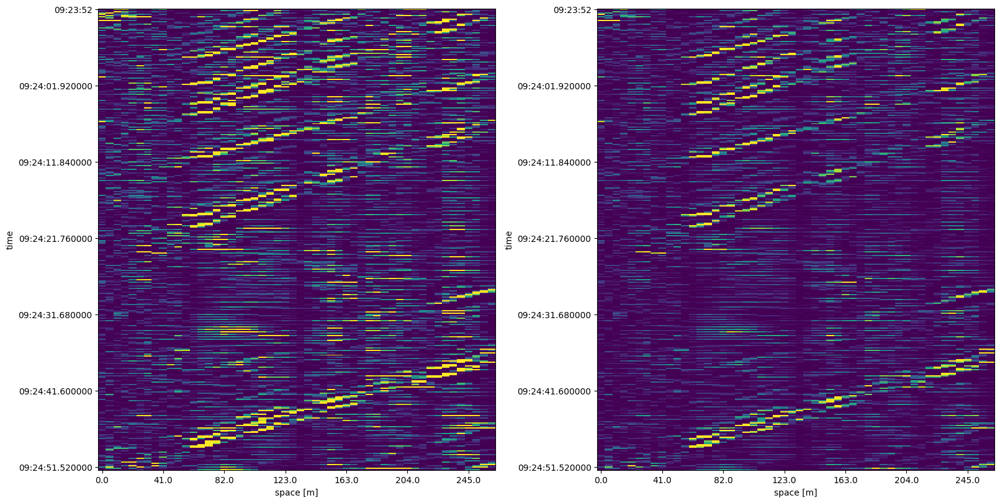

vertical sobel filter conducted to amplify the response of the vertical edges. Image after sobel on the left


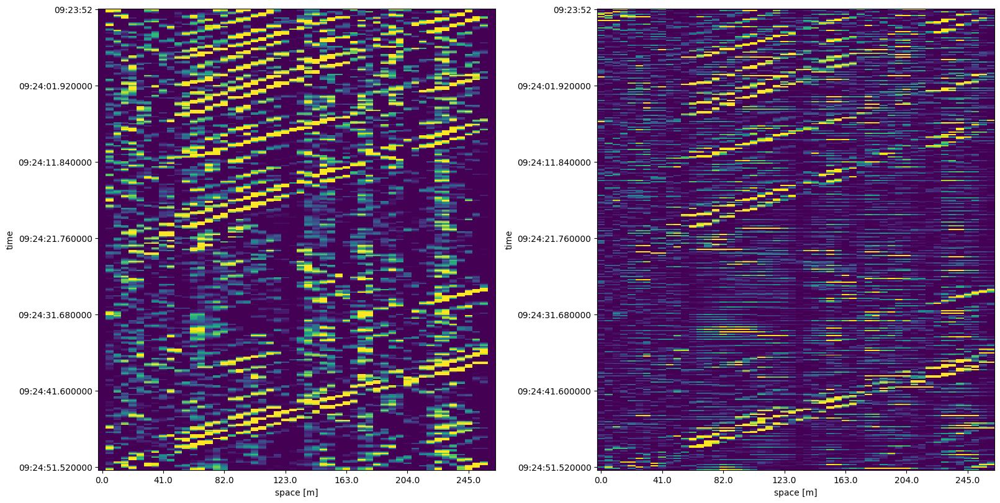

getting rid of the noise, setting, all the values below some percentile to 0,lowpass filter, the denosied image on the left


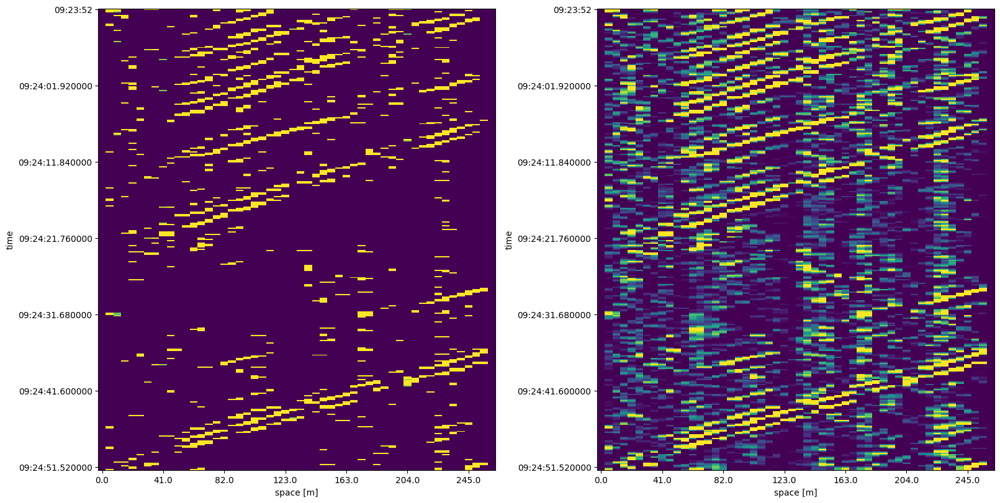

dilating the image 2x2 kernel , the dilated image on the left 


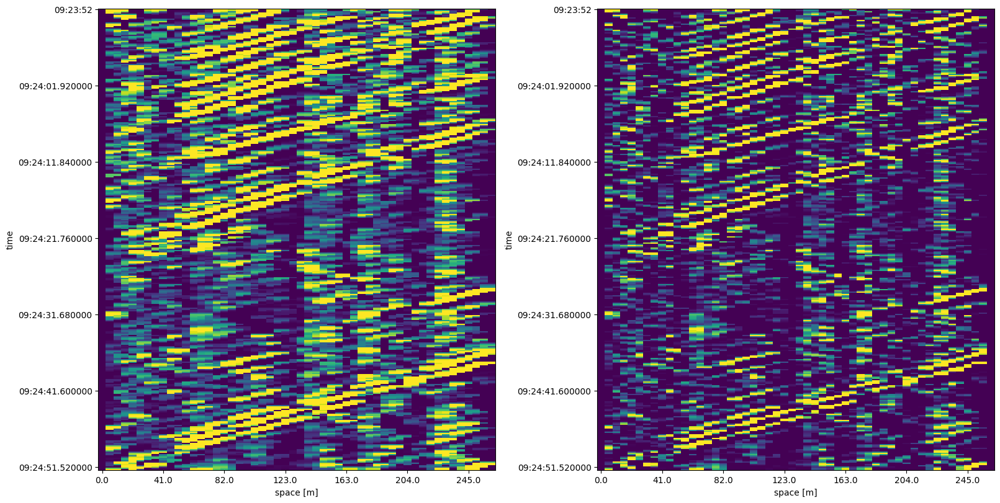

thresholding to keep only the pixrels with the strongest responses >99 percentile, the thresholded image on the left


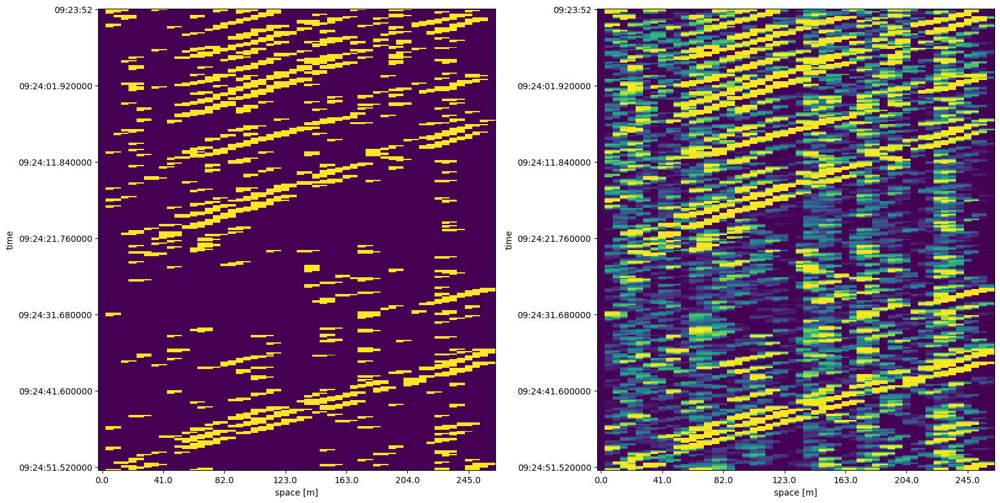

removing the noise , smallest contours which area is below some choosen  threshold are discarded, cleaned image on the left 


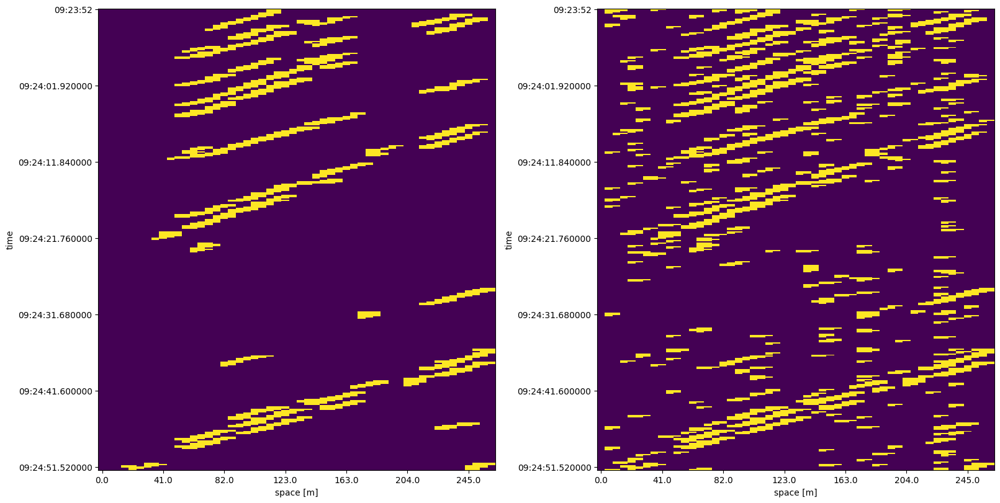

connecting components, by coloring points which have many colored points in the neighbourhood, connected image on the left


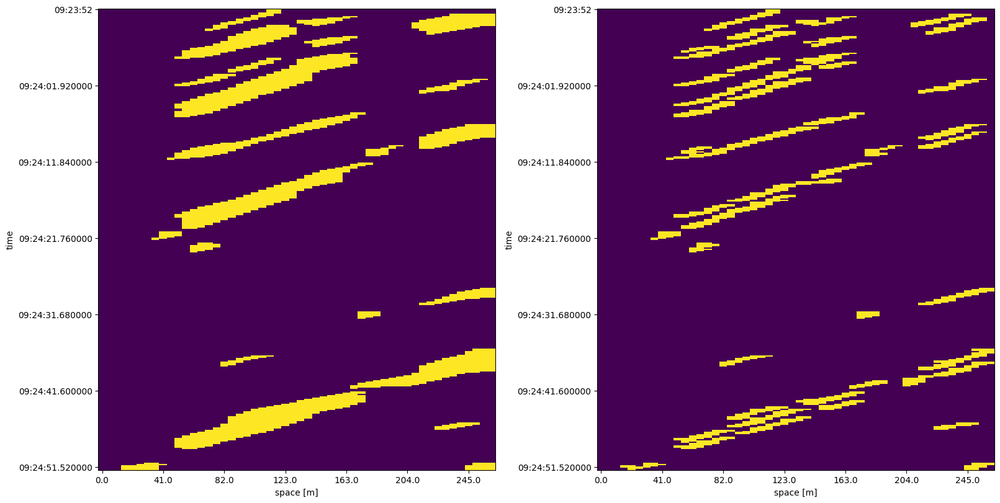

setting the lines of movements  as the furtherst points on the convex hull of the each contour


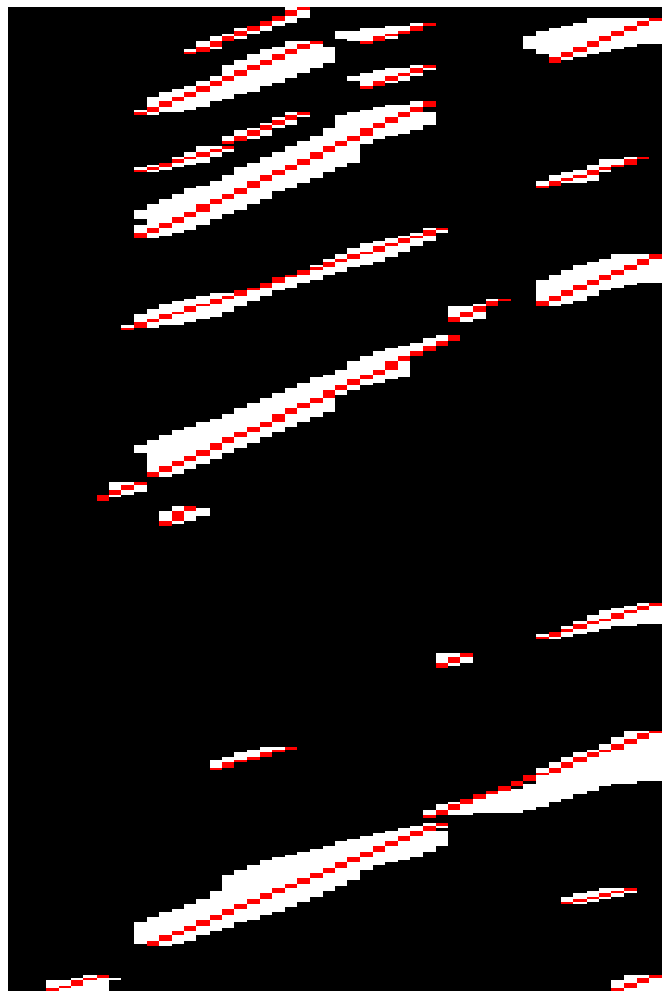

 custom algorithm performed which connects the lines   which can belong to the same vehicle


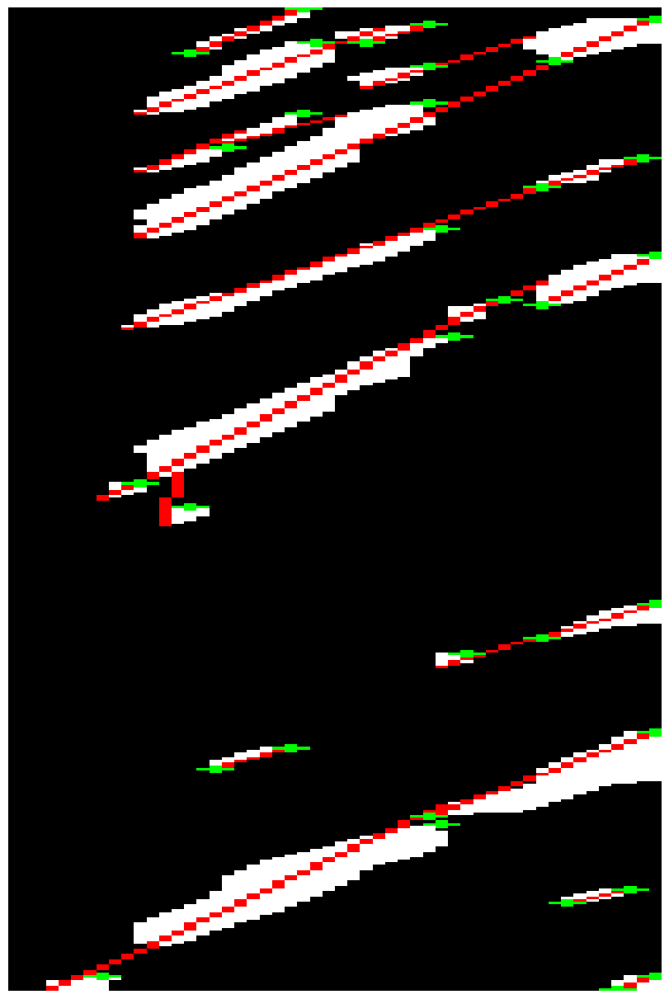

the velocity assesment for the single movements eg contours


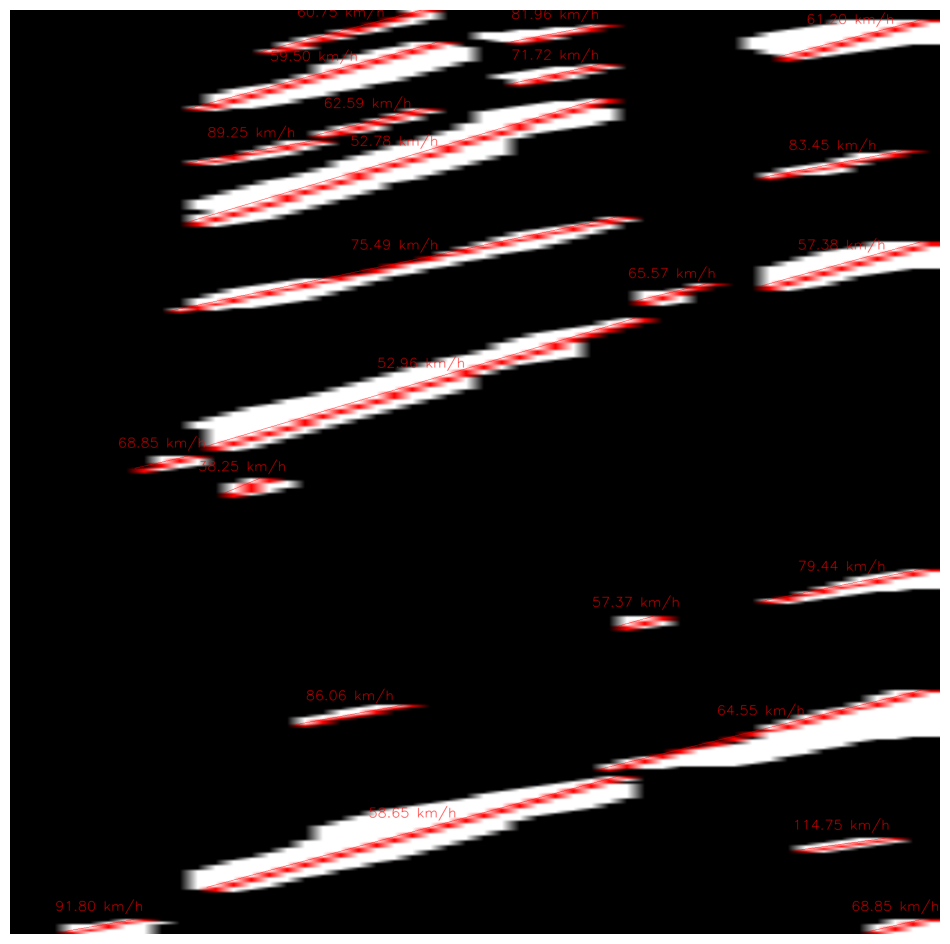

the velocity for the connected movement of vehicles, i.e single movements were connected into movement of one vehicle 


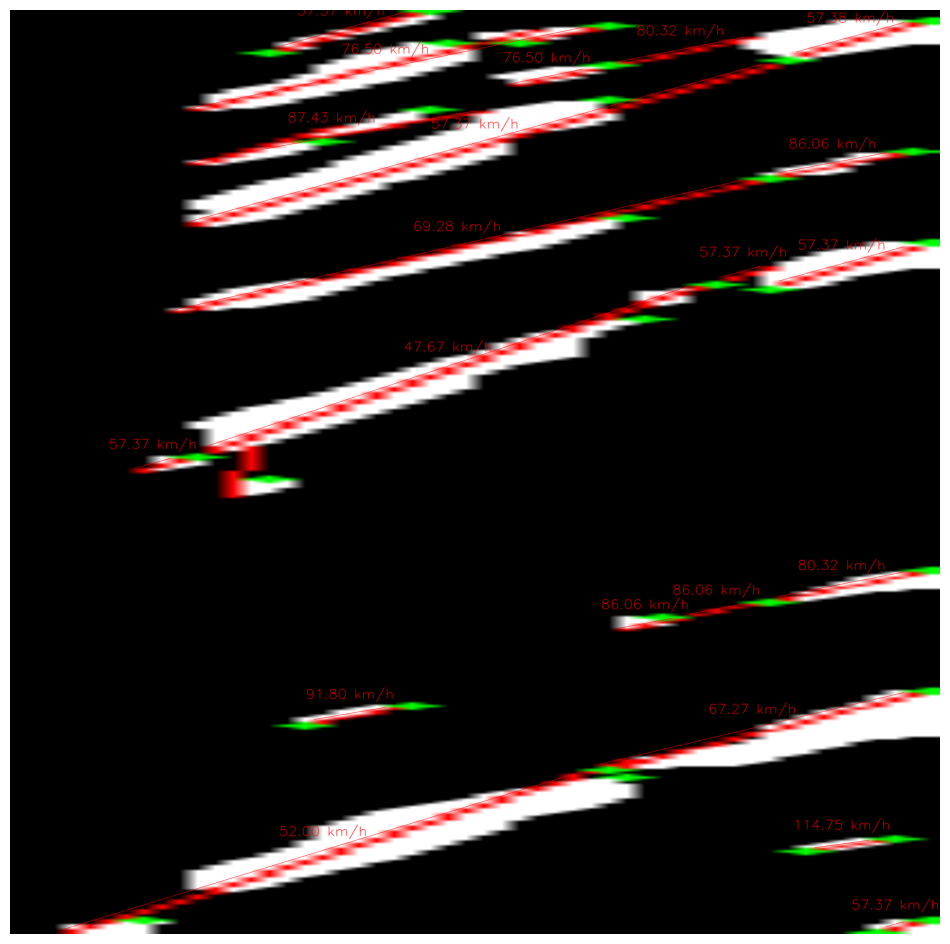

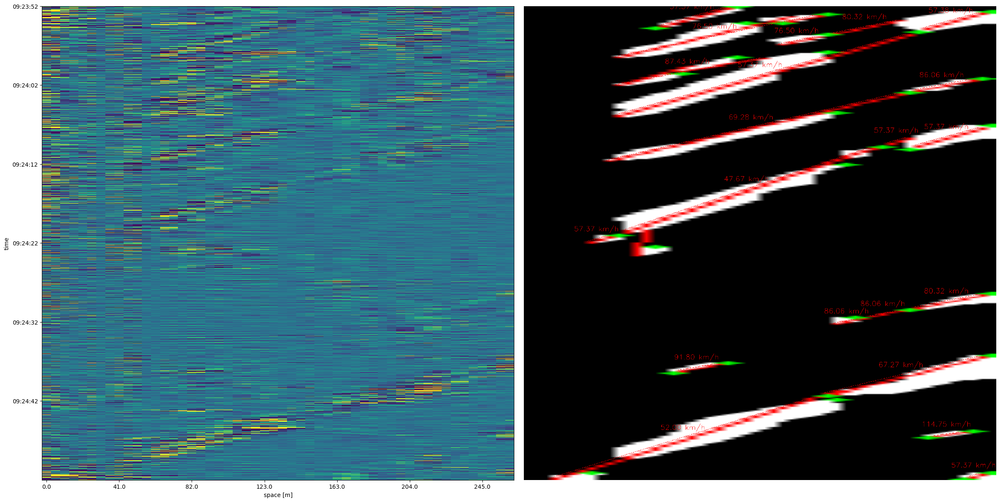

finished processing  of this example























In [42]:
algorithm(data_1,noise[0])
algorithm(data_2,noise[0])
algorithm(data_3,noise[0])
algorithm(data_4,noise[0])




# The results of the algorithm

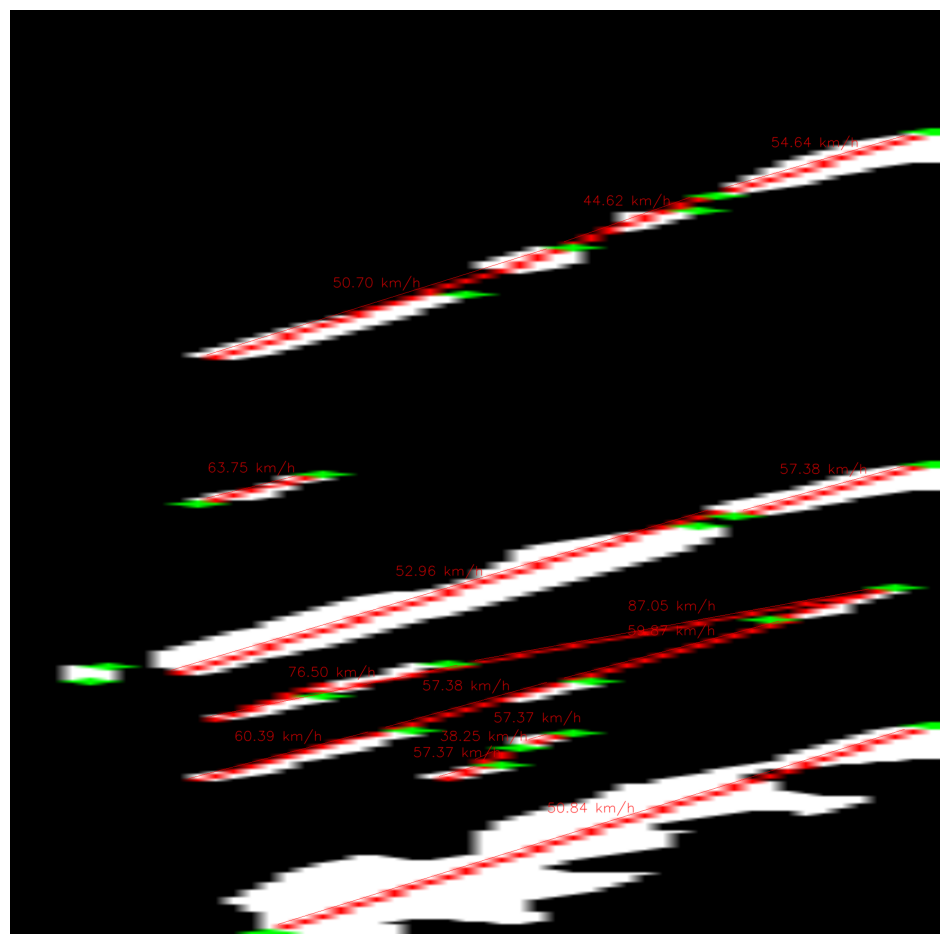

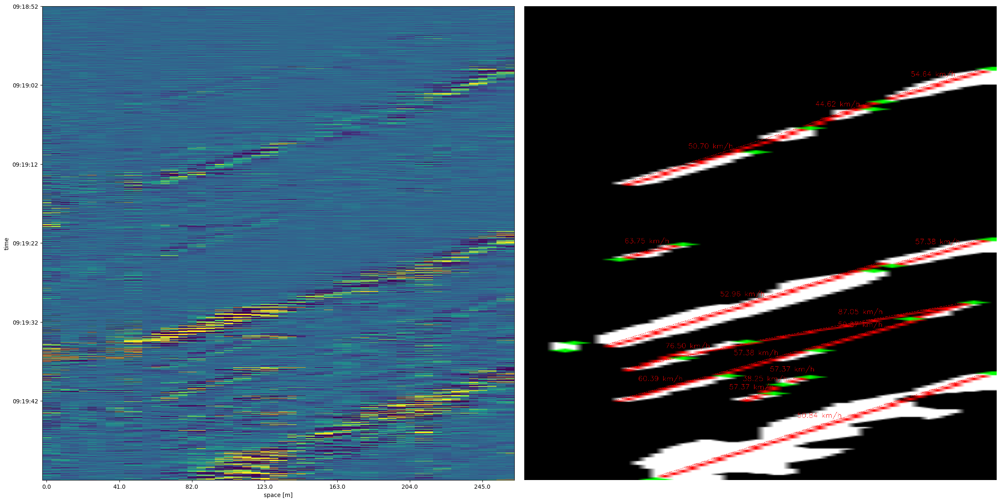

finished processing  of this example




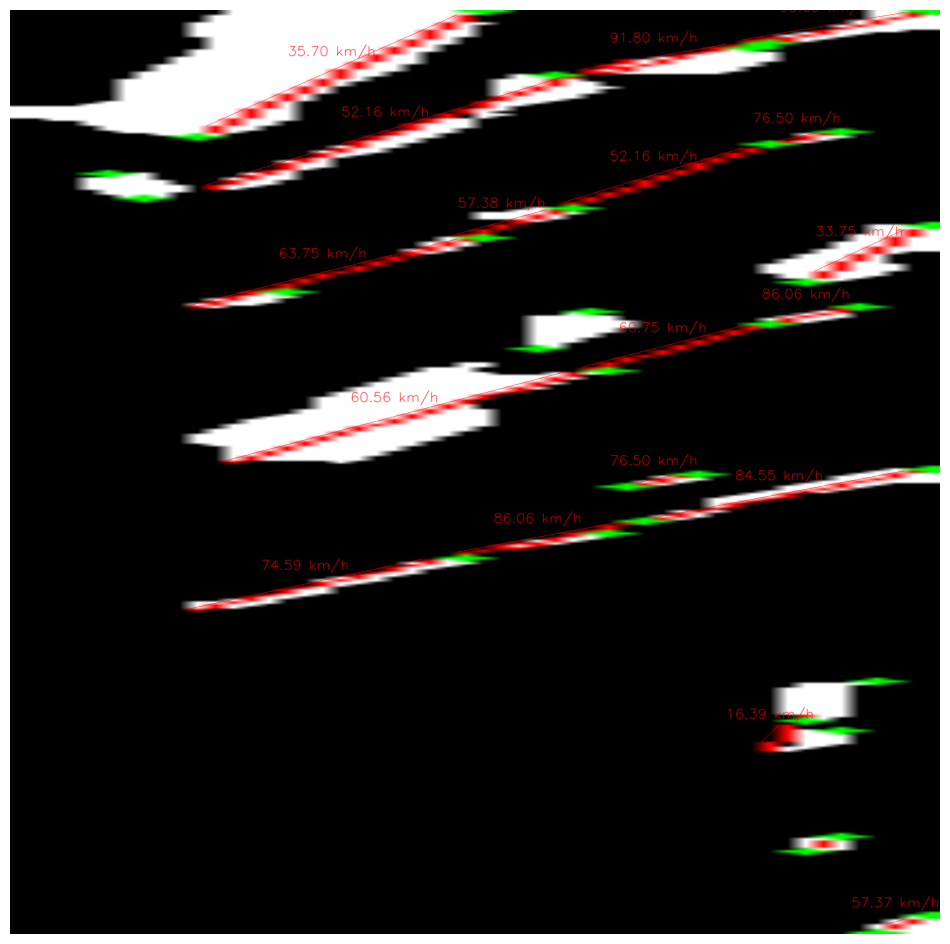

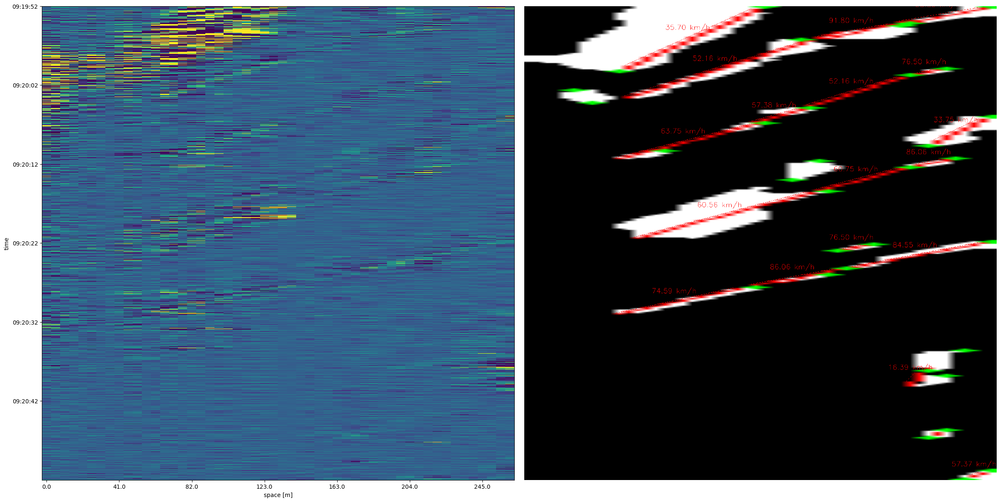

finished processing  of this example




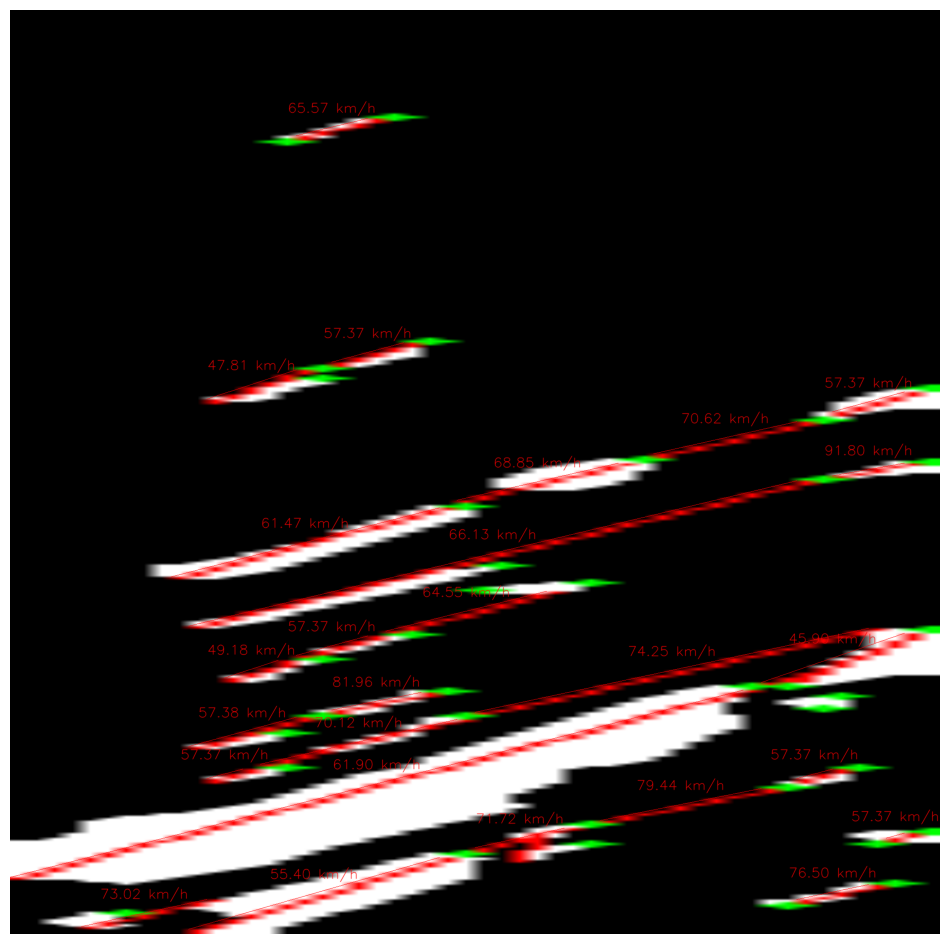

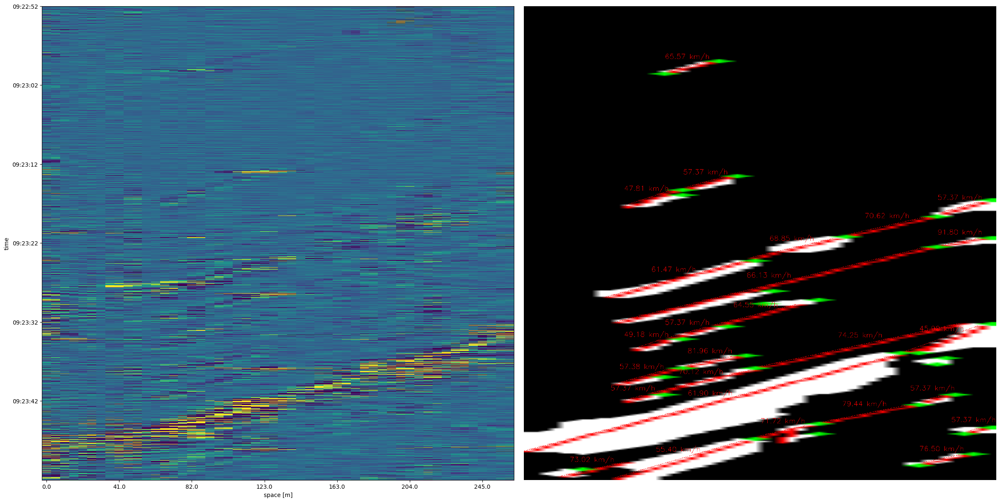

finished processing  of this example




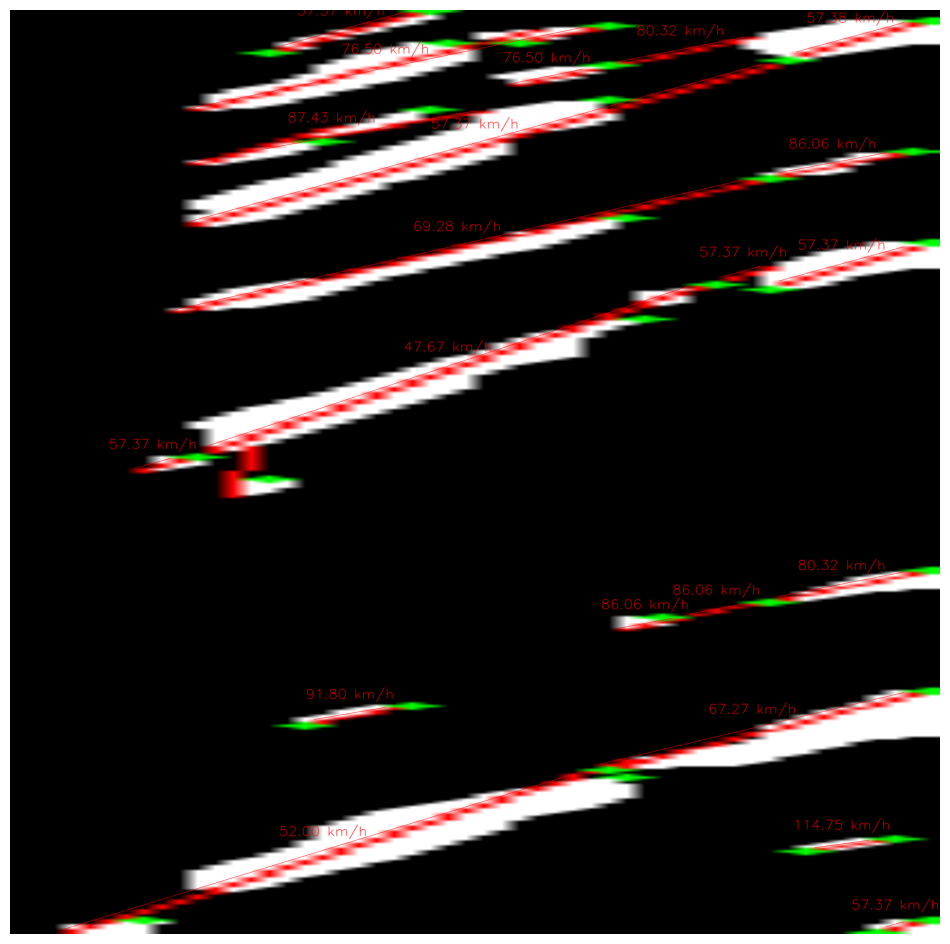

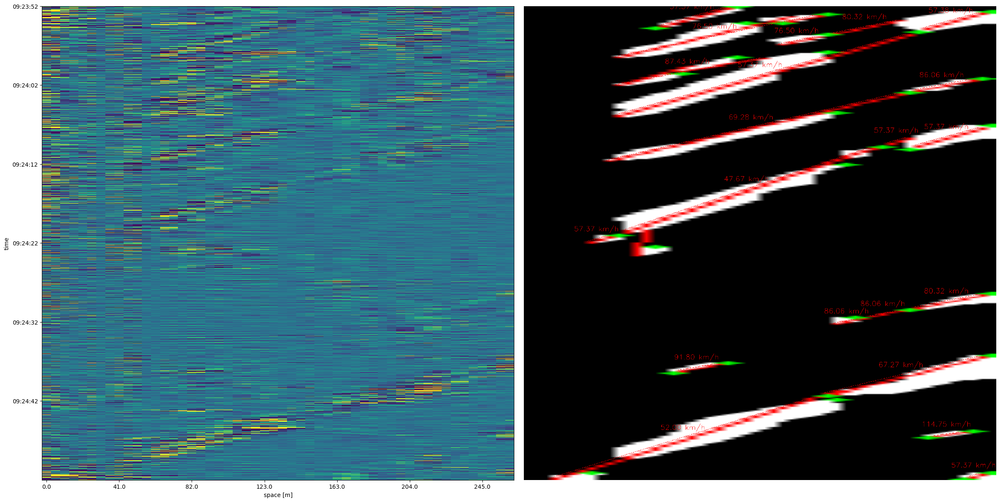

finished processing  of this example




In [43]:
def result(data,noise):
    
    data_mean_denoised = mean_denoising(noise,data,3,True)



    mean_normalized = normalizing_columns(data_mean_denoised,1,True)


    mean_normalized_corrected = gamma_correction(mean_normalized,1.3)
    


    


    downsampled_median = downsampling_time_median(mean_normalized_corrected,100,True)
    


    clipped_first = clip_above_percentile(downsampled_median,97)
    



    clipped_sobeled = sobel_filter_vertical(clipped_first,1)
    
   
    clipped_sobeled_lowpass = low_pass_filter_percentile(clipped_sobeled,97)
    

    
    clipped_sobeled_dilated = dilate(clipped_sobeled,2)
    


   
    threshed = thresholding_percentile(clipped_sobeled_dilated,99)


    

   
    removed_noise = remove_small_components_with_tolerance(threshed,1,tolerance=2)

   

    filled_neighbours = fill_neighbour(removed_noise,iters=6,min_neighbours=12)
    

    

    

    
   

    
    picture_3 = extend_line_and_connect_endpoints(filled_neighbours,5,3,75,show=False)

    


    
    last = calculate_and_display_speeds_resized(picture_3)


    plotting_function_2([data,last])






    print("finished processing  of this example")
    print('\n')


result(data_1,noise[0])
result(data_2,noise[0])
result(data_3,noise[0])
result(data_4,noise[0])

# Conclusions

The algorithm seem to have captured all the moving object, unfortunately it sometimes also captured additional noise, as it definitely is over-sensitive . The velocities at most parts look resonable , however sometimes , when there is remaining noise in the the data, small contours(remaning noise)  create responses with impossible speed  for example like 115 km/h. The connecting the line segments also at most parts look resonable, and the changes are not big in the speed of vehicle, however it could also happen that valid line is connected with noise, thus creating impossible speed.


# Factual and methodological errors

One of the errors that we realized we had commited is  that ,  when using the mean_denosing to denoise our data at the very beggining of the preprocessing pipeline,we forgot about taking the absolute value of the pixels in the image , which makes the  process meaningless in fact, however it turned out to be better than doing this in a right way, i.e subtracting mean(abs(noise)) from abs(image).

I dont know if it is a methodological error, however from the results of the algorithm, we conclude that we were oversensitive, and created some false positive detections. And it could be choosed by the methods that we choosed to work with, or just maybe parameters of the methods used, maybe a bigger dilation kernel, or mores strict high pass filter could help in reducing this false positive results and would improve the precision.